# Algorytmy genetyczne
### Zastosowanie algorytmów genetycznych w rozwiązaniu problemu komiwojażera dla optymalizacji tras między automatami paczkowymi.
---
Opracowanie: `Kajetan Kowalski 421071`, IAD III rok, grupa ćwiczeniowa 1.

## CZĘŚĆ I - Przygotowanie Danych

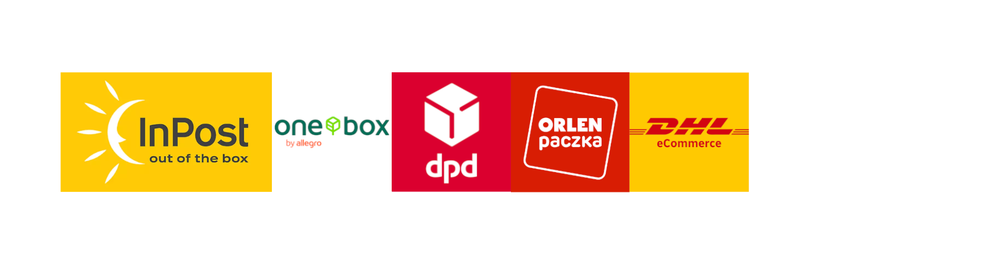

### 1. Wczytanie bibliotek

In [1]:
import os
import io
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import imageio.v2 as imageio
import networkx as nx
import geopandas as gpd
import osmnx as ox
import contextily as ctx
import folium
from folium.plugins import PolyLineTextPath
from dataclasses import dataclass
from shapely.geometry import Point, LineString
from geopy.distance import geodesic

### 2. Ustawienie parametrów obszaru

In [2]:
REGION_NAME = "Kraków, Poland"
OPERATOR = "InPost" #InPost/Allegro/DPD/Orlen/DHL 
N_POINTS = 35
SEED = 421071

# GA
POPULATION_SIZE = 200
GENERATIONS = 150
CROSSOVER_RATE = 0.97
MUTATION_RATE = 0.15
ELITE_SIZE = 6
STAGNATION_LIMIT = 60
MAX_GEN = 5000

# ACO
N_ANTS = 60
N_CYCLES = 200
ALPHA = 1.2
BETA = 2.0
EVAPORATION = 0.5
Q = 1200.0
START_FIXED = False
CONVERGENCE_STOP = True

PLOT_FIGSIZE = (12, 12)
city_name = REGION_NAME.split(",")[0]

In [3]:
assert "poland" in REGION_NAME.lower(), "Błąd: analizowany region musi znajdować się w Polsce."

#### 2.1. Pobranie obszaru badanego miasta.

Zapisywany jest poligon ograniczający obszar badanego miasta, w obrębie którego będą poszukiwane paczkomaty i optymalne trasy.

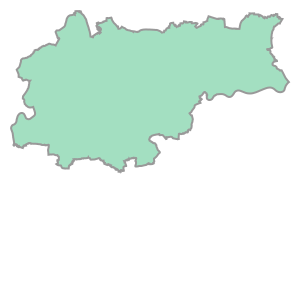

In [4]:
region_gdf = ox.geocode_to_gdf(REGION_NAME).to_crs(epsg=2180)
polygon = region_gdf.geometry.iloc[0]
polygon

### 3. Funkcja pobierająca dane lokalizacyjne automatów paczkowych.
Zamysłem projektu jest wykorzystanie danych rzeczywistych, dlatego punktami docelowymi, które ma odwiedzić komiwojażer, w tym przypadku kurier, są paczkomaty. Funkcja pobiera z serwisu OpenStreetMap dane dotyczące obiektów oznaczonych tagami odpowiadającymi paczkomatom, tj. `parcel_locker` oraz `parcel_pickup`. Następnie spośród wszystkich pobranych obiektów filtrowane są wyłącznie automaty paczkowe zadanego operatora. Z całego zbioru dostępnych punktów na zadanym obszarze losowana jest próbka o liczności określonej parametrem `n_size`. Jeżeli wartość n_size jest większa niż liczba dostępnych paczkomatów, funkcja uwzględnia wszystkie dostępne obiekty. W wyniku działania funkcji zwracany jest obiekt typu GeoDataFrame zawierający wybrane paczkomaty wraz z ich lokalizacją. Dodam, że początkowo program był przystosowany do obsługi jedynie InPostu, a dopiero później rozszeżony o innych operatorów, stąd wynika nazewnictwo zmiennych czy funkcji.

In [5]:
def get_paczkomat(region_name, n_size, seed=42, operator_name="InPost"):
    """
    Pobiera lokalizacje paczkomatów InPost z OpenStreetMap dla wybranego regionu,
    filtruje punkty InPost i losuje podaną liczbę paczkomatów.

    Parametry:
        region_name (str): nazwa analizowanego regionu
        n_size (int): liczba paczkomatów do wylosowania
        seed (int, opcjonalnie): ziarno losowości

    Zwraca:
        tuple: granica regionu jako GeoDataFrame oraz wylosowane paczkomaty jako GeoDataFrame
    """
    region_gdf = ox.geocode_to_gdf(region_name).to_crs(epsg=2180)
    polygon = region_gdf.geometry.iloc[0]

    tagi = {
        "amenity": ["parcel_locker", "vending_machine"],
        "vending": "parcel_pickup"
    }

    features = ox.features_from_place(region_name, tags=tagi).to_crs(epsg=2180)

    inpost = features["brand"].fillna("").str.contains(operator_name, case=False)
    pts_mask = features.geometry.type.isin(["Point", "MultiPoint"])

    inpost_pts = features[inpost & pts_mask].copy()
    inpost_pts = inpost_pts[inpost_pts.geometry.within(polygon)].copy()

    cols = ["ref", "brand", "geometry"]
    out_cols = [col for col in cols if col in inpost_pts.columns]

    inpost_clean = inpost_pts[out_cols].copy()
    inpost_clean = inpost_clean.rename(columns={"ref": "paczkomat_code"})

    smpl_size = min(n_size, len(inpost_clean))
    lockers_sample = inpost_clean.sample(n=smpl_size, random_state=seed).reset_index(drop=True)

    lockers_sample["id"] = range(len(lockers_sample))

    if "paczkomat_code" not in lockers_sample.columns:
        lockers_sample["paczkomat_code"] = None

    lockers_sample["name"] = lockers_sample["paczkomat_code"]
    lockers_sample["name"] = lockers_sample["name"].fillna(
        lockers_sample["id"].apply(lambda i: f"{operator_name}_{i}")
    )

    lockers_sample["x"] = lockers_sample.geometry.x
    lockers_sample["y"] = lockers_sample.geometry.y

    lockers_sample = lockers_sample[["id", "name", "paczkomat_code", "brand", "geometry", "x", "y"]]

    return region_gdf, lockers_sample

#### 3.1. Pobranie paczkomatów i wyświetlenie danych

In [6]:
region_gdf, points_gdf = get_paczkomat(REGION_NAME, N_POINTS, seed=42, operator_name= OPERATOR)
points_gdf

,id,name,paczkomat_code,brand,geometry,x,y
0,0,KRA280M,KRA280M,Paczkomat InPost,POINT (564974.983 243052.775),564974.983287,243052.775133
1,1,KRA08A,KRA08A,Paczkomat InPost,POINT (568866.132 240487.521),568866.131500,240487.521058
2,2,KRA349M,KRA349M,Paczkomat InPost,POINT (568313.801 247593.249),568313.801440,247593.248715
3,3,KRA34BAPP,KRA34BAPP,Appkomat InPost,POINT (568668.672 249462),568668.672051,249461.999809
4,4,KRA311M,KRA311M,Paczkomat InPost,POINT (572817.526 244359.792),572817.525901,244359.792196
5,5,KRA110M,KRA110M,Paczkomat InPost,POINT (571666.188 246547.161),571666.188123,246547.160515
6,6,KRA71BAPP,KRA71BAPP,Appkomat InPost,POINT (571552.349 239184.874),571552.348846,239184.873944
7,7,KRA381M,KRA381M,Paczkomat InPost,POINT (568964.806 243977.125),568964.806101,243977.124999
8,8,KRA17APP,KRA17APP,Appkomat InPost,POINT (566509.985 242428.566),566509.985356,242428.565537
9,9,KRA10M,KRA10M,Paczkomat InPost,POINT (572595.408 247720.736),572595.407730,247720.735780


### 4. Funkcja pobierająca punkt początkowy trasy.

W celu urealistycznienia przebiegu trasy przyjęto, że domniemany kurier rozpoczyna podróż z punktu stacjonarnego InPost. Może to być zarówno lokalna placówka, jak i większy obiekt logistyczny, np. sortownia. Ze względu na specyfikę danych OpenStreetMap oraz brak jednoznacznego rozróżnienia wszystkich typów obiektów InPost na potrzeby projektu nie wprowadzano bardziej szczegółowej klasyfikacji takich budynków. Zamiast tego wybierany jest pierwszy znaleziony obiekt spełniający zadane kryteria w obrębie analizowanego regionu. Projekt nie ogranicza się wyłącznie do dużych aglomeracji, dlatego użytkownik może wskazać dowolną miejscowość w Polsce. Jeżeli na danym obszarze nie zostanie odnaleziona placówka InPost, punkt startowy stanowi pierwszy dostępny paczkomat z przekazanego zbioru. W sytuacji, gdy nie są dostępne również takie dane, jako awaryjny punkt początkowy przyjmowany jest środek geometryczny analizowanego obszaru.

In [7]:
def get_sortownia(region_name, points_gdf=None, operator_name="InPost"):
    """
    Wyznacza lokalizację punktu startowego (depotu) dla trasy kuriera.

    Funkcja wyszukuje w OpenStreetMap placówkę operatora w podanym regionie.
    Jeśli taka placówka nie zostanie znaleziona, jako punkt startowy używany
    jest pierwszy paczkomat z points_gdf.

    Parametry:
        region_name (str): nazwa regionu do wyszukania w OpenStreetMap
        points_gdf (GeoDataFrame, opcjonalnie): zbiór lokalizacji paczkomatów
            używany jako zapasowe źródło punktu startowego
        operator_name (str, opcjonalnie): nazwa operatora logistycznego
            (domyślnie "InPost")

    Zwraca:
        GeoDataFrame: jednoelementowy GeoDataFrame z wybranym punktem startowym
    """
    region_gdf = ox.geocode_to_gdf(region_name).to_crs(epsg=2180)
    polygon = region_gdf.geometry.iloc[0]

    depots = gpd.GeoDataFrame()

    try:
        tagi = {"amenity": "post_office"}
        start_points = ox.features_from_place(region_name, tags=tagi).to_crs(epsg=2180)
        mask_operator = start_points["operator"].fillna("").str.contains(operator_name, case=False) if "operator" in start_points.columns else False
        start_points = start_points[mask_operator].copy()

        if not start_points.empty:
            depots = start_points.copy()
    except Exception:
        pass

    if depots.empty:
        try:
            tagi_r = {"amenity": "post_depot", "industrial": "logistics"}
            start_points = ox.features_from_place(region_name, tags=tagi_r).to_crs(epsg=2180)
            maska = start_points.astype(str).sum(axis=1).str.contains(operator_name, case=False)
            start_points = start_points[maska].copy()

            if not start_points.empty:
                depots = start_points.copy()
        except Exception:
            pass

    if not depots.empty:
        depot_geom = depots.geometry.representative_point().iloc[0]
        source = f"osm_{operator_name}_facility"
        name = "Sortownia"
        paczkomat_code = "SORTOWNIA"
        brand = operator_name

    elif points_gdf is not None and not points_gdf.empty:
        first_point = points_gdf.iloc[0]
        depot_geom = first_point.geometry
        source = "first_paczkomat_fallback"
        name = "START"
        paczkomat_code = first_point["paczkomat_code"] if "paczkomat_code" in first_point.index else None
        brand = first_point["brand"] if "brand" in first_point.index else operator_name

    else:
        depot_geom = polygon.centroid
        source = "region_centroid_fallback"
        name = "START"
        paczkomat_code = "START_FALLBACK"
        brand = operator_name

    depot_gdf = gpd.GeoDataFrame({
        "id": [0],
        "name": [name],
        "paczkomat_code": [paczkomat_code],
        "brand": [brand],
        "source": [source],
        "geometry": [depot_geom],
        "x": [depot_geom.x],
        "y": [depot_geom.y]
    }, crs="EPSG:2180")

    return depot_gdf

In [8]:
depot_gdf = get_sortownia(REGION_NAME, points_gdf=points_gdf, operator_name = OPERATOR)
depot_gdf

,id,name,paczkomat_code,brand,source,geometry,x,y
0,0,Sortownia,SORTOWNIA,InPost,osm_InPost_facility,POINT (569542.865 246655.938),569542.864701,246655.937682


#### 4. Połączenie danych punktów odbioru paczek oraz punktu startowego w jedną ramkę.

In [9]:
only_points_gdf = points_gdf.copy()

if depot_gdf.iloc[0]["source"] == "first_paczkomat_fallback":
    only_points_gdf = only_points_gdf.iloc[1:].copy()

only_points_gdf["id"] = range(1, len(only_points_gdf) + 1)
all_points_gdf = pd.concat([depot_gdf, only_points_gdf], ignore_index=True)
all_points_gdf = gpd.GeoDataFrame(all_points_gdf, geometry="geometry", crs="EPSG:2180")

#### 5. Przygotowanie wizualizacji

In [10]:
def prepare_folium_points(region_gdf, all_points_gdf):
    region_wgs84 = region_gdf.to_crs(epsg=4326).copy()
    points_wgs84 = all_points_gdf.to_crs(epsg=4326).copy()

    points_wgs84["lon"] = points_wgs84.geometry.x
    points_wgs84["lat"] = points_wgs84.geometry.y

    return region_wgs84, points_wgs84

In [11]:
region_folium_gdf, points_folium_gdf = prepare_folium_points(region_gdf, all_points_gdf)
points_folium_gdf.head()

,id,name,paczkomat_code,brand,source,geometry,x,y,lon,lat
0,0,Sortownia,SORTOWNIA,InPost,osm_InPost_facility,POINT (19.97234 50.08308),569542.864701,246655.937682,19.972336,50.083083
1,1,KRA280M,KRA280M,Paczkomat InPost,NaN,POINT (19.90787 50.05119),564974.983287,243052.775133,19.907866,50.051188
2,2,KRA08A,KRA08A,Paczkomat InPost,NaN,POINT (19.96177 50.02767),568866.131500,240487.521058,19.961766,50.027675
3,3,KRA349M,KRA349M,Paczkomat InPost,NaN,POINT (19.95532 50.09166),568313.801440,247593.248715,19.955322,50.091657
4,4,KRA34BAPP,KRA34BAPP,Appkomat InPost,NaN,POINT (19.96062 50.10843),568668.672051,249461.999809,19.960620,50.108427


In [12]:
def plot_folium(region_gdf, points_gdf):
    center_lat = points_gdf["lat"].mean()
    center_lon = points_gdf["lon"].mean()

    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=13,
        control_scale=True,
        tiles="cartodbpositron"
    )

    folium.GeoJson(
        region_gdf.to_json(),
        name="Obszar",
        style_function=lambda feature: {
            "fillColor": "#00000000",
            "color": "black",
            "weight": 2
        },
        tooltip="Granica obszaru"
    ).add_to(m)

    brand_colors = {
        "inpost": "orange",
        "allegro": "green",
        "dpd": "cadetblue",
        "orlen": "darkred",
        "dhl": "lightred"
    }

    for _, row in points_gdf.iterrows():
        location = [row["lat"], row["lon"]]
        brand = str(row.get("brand", "")).lower()

        if row["id"] == 0 or row["name"] in ["Sortownia", "Placówka", "Facility", "START"]:
            icon = folium.Icon(
                color="red",
                icon="warehouse",
                prefix="fa"
            )
            tooltip = f"Punkt startowy: {row['name']}"
            popup = (
                f"<b>Punkt startowy</b><br>"
                f"Nazwa: {row['name']}<br>"
                f"Źródło: {row.get('source', 'brak')}<br>"
                f"Marka: {row.get('brand', 'brak')}"
            )
        else:
            icon_color = "blue"
            for key, color in brand_colors.items():
                if key in brand:
                    icon_color = color
                    break

            icon = folium.Icon(
                color=icon_color,
                icon="box-open",
                prefix="fa"
            )
            tooltip = f"Automat paczkowy: {row['name']}"
            popup = (
                f"<b>Automat paczkowy</b><br>"
                f"Kod: {row.get('paczkomat_code', 'brak')}<br>"
                f"Marka: {row.get('brand', 'brak')}"
            )

        folium.Marker(
            location=location,
            icon=icon,
            tooltip=tooltip,
            popup=folium.Popup(popup, max_width=300)
        ).add_to(m)

    folium.LayerControl().add_to(m)
    return m

In [13]:
m1 = plot_folium(region_folium_gdf, points_folium_gdf)
m1.save("mapa.html")
m1

In [14]:
def plot_static(region_gdf, all_points_gdf, title="Punkt startowy i automaty paczkowe", use_basemap=True):
    fig, ax = plt.subplots(figsize=PLOT_FIGSIZE)

    region_plot = region_gdf.copy()
    points_plot = all_points_gdf.copy()

    region_plot.boundary.plot(
        ax=ax,
        linewidth=2,
        edgecolor="black",
        alpha=0.8,
        zorder=1
    )

    brand_colors = {
        "inpost": "#FFCC00",
        "allegro": "#2E7D32",
        "dpd": "#1565C0",
        "orlen": "#C62828",
        "dhl": "#F9A825"
    }

    is_depot = (
        (points_plot["id"] == 0) |
        (points_plot["name"].isin(["Sortownia", "Placówka", "Facility", "START"]))
    )

    depot = points_plot[is_depot].copy()
    lockers = points_plot[~points_plot.index.isin(depot.index)].copy()

    if not lockers.empty:
        for brand_key, color in brand_colors.items():
            subset = lockers[
                lockers["brand"].fillna("").str.lower().str.contains(brand_key)
            ].copy()

            if not subset.empty:
                ax.scatter(
                    subset["x"],
                    subset["y"],
                    s=120,
                    marker="o",
                    facecolor=color,
                    edgecolor="black",
                    linewidth=1.4,
                    alpha=0.95,
                    zorder=3,
                    label=f"Paczkomat {brand_key.upper()}"
                )

        other_lockers = lockers[
            ~lockers["brand"].fillna("").str.lower().str.contains(
                "|".join(brand_colors.keys())
            )
        ].copy()

        if not other_lockers.empty:
            ax.scatter(
                other_lockers["x"],
                other_lockers["y"],
                s=120,
                marker="o",
                facecolor="#BDBDBD",
                edgecolor="black",
                linewidth=1.4,
                alpha=0.95,
                zorder=3,
                label="Inny operator"
            )

    if not depot.empty:
        ax.scatter(
            depot["x"],
            depot["y"],
            s=100,
            marker="D",
            facecolor="#D32F2F",
            edgecolor="black",
            linewidth=1.6,
            alpha=1.0,
            zorder=4,
            label="Punkt startowy"
        )

    for _, row in lockers.iterrows():
        ax.text(
            row["x"] + 35,
            row["y"] + 35,
            str(row["name"]),
            fontsize=7,
            fontweight="semibold",
            color="black",
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.65, pad=1.5),
            zorder=5
        )

    for _, row in depot.iterrows():
        ax.text(
            row["x"] + 45,
            row["y"] + 45,
            str(row["name"]),
            fontsize=9,
            fontweight="bold",
            color="#8B0000",
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.8, pad=2),
            zorder=6
        )

    if use_basemap:
        try:
            ctx.add_basemap(ax, crs=region_plot.crs)
        except Exception:
            pass

    ax.set_title(title, fontsize=15, fontweight="bold")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.legend(frameon=True)
    plt.tight_layout()
    plt.show()

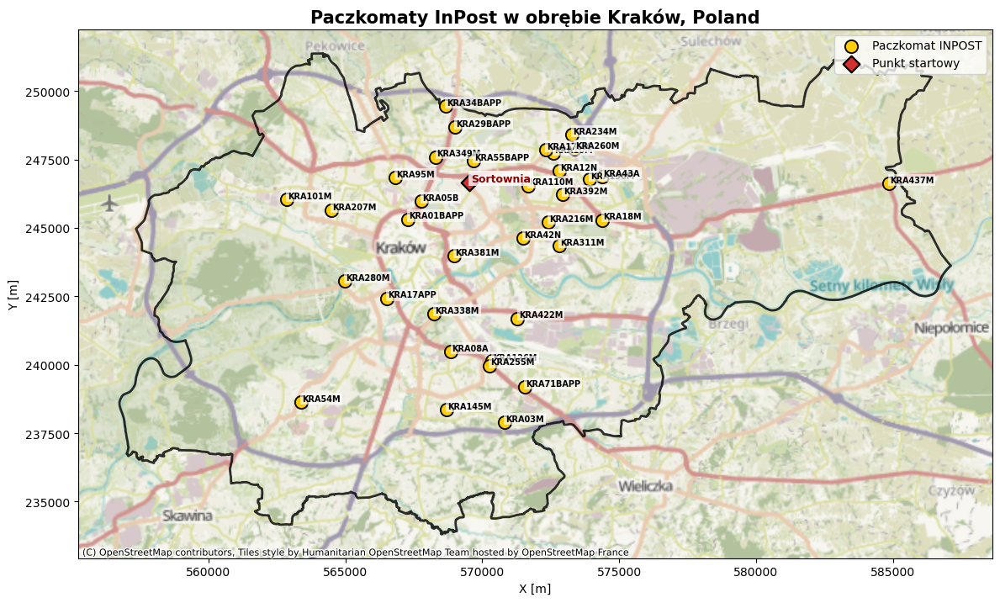

In [15]:
plot_static(region_gdf, all_points_gdf, f"Paczkomaty {OPERATOR} w obrębie {REGION_NAME}", use_basemap=True)

### 6. Wyznaczenie macierzy odległosci.
W celu zachowania możliwie wysokiego realizmu analizy nie wykorzystano odległości geodezyjnych liczonych w linii prostej, lecz rzeczywistą sieć drogową pobraną z OpenStreetMap za pomocą biblioteki OSMnx. Graf wygenerowano z parametrem `network_type="drive"`, co oznacza uwzględnienie wyłącznie infrastruktury dostępnej dla ruchu samochodowego. Dzięki temu w modelu pośrednio uwzględniane są m.in. ulice jednokierunkowe, organizacja skrzyżowań oraz ograniczenia ruchu. Następnie każdy punkt został przypisany do najbliższego węzła grafu drogowego, co umożliwiło wyznaczenie najkrótszych tras pomiędzy punktami z użyciem algorytmu Dijkstry. Należy jednak zaznaczyć, że odwzorowanie to nie jest idealne, ponieważ w niektórych przypadkach sieć drogowa nie prowadzi bezpośrednio do dokładnej lokalizacji automatu paczkowego, a jedynie do najbliższego osiągalnego węzła grafu.

In [16]:
G = ox.graph_from_place(REGION_NAME, network_type="drive")
G_proj = ox.project_graph(G, to_crs="EPSG:2180")

all_points_gdf["nearest_node"] = ox.distance.nearest_nodes(
    G_proj, 
    X=all_points_gdf["x"].to_list(), 
    Y=all_points_gdf["y"].to_list()
)

print(f"Zmapowano {len(all_points_gdf)} punktów na węzły grafu.")

Zmapowano 36 punktów na węzły grafu.


In [17]:
def build_routing_data(G, points_gdf, weight="length"):
    """
    Tworzy macierz kosztów oraz słownik ścieżek w jednej wydajnej operacji.
    """
    node_ids = points_gdf["nearest_node"].to_list()
    names = points_gdf["name"].to_list()
    n = len(node_ids)

    cost_matrix = np.full((n, n), np.inf, dtype=float)
    path_cache = {}
    for i, source_node in enumerate(node_ids):
        # algorytm dijkstry do wyznaczenia najkroszej trasy
        lengths, paths = nx.single_source_dijkstra(G, source_node, weight=weight)
        
        for j, target_node in enumerate(node_ids):
            if target_node in lengths:
                cost_matrix[i, j] = lengths[target_node]
                path_cache[(i, j)] = paths[target_node]
            else:
                path_cache[(i, j)] = None

    cost_df = pd.DataFrame(cost_matrix, index=names, columns=names)
    
    return cost_matrix, cost_df, path_cache

#### Macierz odległości

In [18]:
cost_matrix, cost_df, path_cache = build_routing_data(G_proj, all_points_gdf)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
cost_df.round(1)

,Sortownia,KRA280M,KRA08A,KRA349M,KRA34BAPP,KRA311M,KRA110M,KRA71BAPP,KRA381M,KRA17APP,KRA10M,KRA437M,KRA156M,KRA101M,KRA175M,KRA126M,KRA422M,KRA207M,KRA255M,KRA55BAPP,KRA42N,KRA54M,KRA392M,KRA43A,KRA12N,KRA03M,KRA338M,KRA95M,KRA145M,KRA260M,KRA05B,KRA18M,KRA216M,KRA01BAPP,KRA234M,KRA29BAPP
Sortownia,0.0,7264.5,8835.4,2966.6,6571.0,5796.9,4232.2,10295.5,3871.6,7013.1,4901.3,16954.0,6087.9,8853.3,4566.4,8483.8,7480.3,7056.6,8379.7,1809.1,4219.9,12129.2,5283.2,6328.4,4588.9,11703.4,6343.6,4139.5,11011.2,5476.3,3129.0,5902.7,4259.6,4069.5,6156.1,3849.8
KRA280M,7752.1,0.0,6018.6,6831.0,10282.6,9827.4,9022.0,9139.2,4813.1,2855.0,10799.6,21635.3,10769.2,6522.3,10464.7,7327.5,8458.8,5102.7,7223.4,7765.7,8250.3,7503.7,9964.5,11009.7,10442.1,9265.0,4861.7,5574.0,8194.4,11374.6,5081.9,10584.0,8802.8,4274.6,12054.3,7929.9
KRA08A,9774.8,7262.9,0.0,9725.8,13330.1,9208.2,9587.8,3414.0,5863.8,5393.3,11588.3,21055.4,10746.5,10707.0,11253.5,1602.3,6272.2,9287.3,1498.2,9788.3,7251.7,8527.5,10538.4,10987.0,11074.5,3795.0,4832.3,9173.6,3551.2,12005.5,8155.3,10552.4,8472.9,7414.0,12424.9,10824.7
KRA349M,3334.9,6747.3,9863.5,0.0,3604.4,7703.3,4759.1,11340.7,5080.1,7154.9,5288.0,18650.2,6676.6,7020.7,4959.5,9529.0,8903.4,5620.1,9424.9,2064.2,6126.2,12348.5,6098.1,7201.3,5115.8,12748.6,7388.8,2338.7,12039.2,6003.2,1934.5,7598.9,6344.4,3319.1,6682.9,1442.4
KRA34BAPP,5438.2,9020.1,12136.3,2588.2,0.0,9806.6,6504.8,13613.5,7352.9,9427.7,6189.8,20395.9,8048.1,8906.9,5861.3,11801.8,11176.2,7765.9,11697.7,3827.5,8229.5,14621.3,7843.8,8443.0,6861.5,15021.4,9661.6,4693.8,14312.0,7199.8,4207.3,9344.6,8425.2,5591.9,7606.6,1283.3
KRA311M,6453.6,10270.7,9252.9,8243.1,11847.5,0.0,4333.3,10380.7,5891.4,9191.2,5355.0,13867.3,4227.6,13020.1,5999.0,8806.1,6403.6,11453.8,8702.0,6998.4,1997.1,13461.6,4025.2,4468.1,4638.7,11761.2,7822.4,9416.1,11422.0,5492.3,8253.7,4033.5,1954.0,8073.9,5905.9,9126.4
KRA110M,4459.6,9734.6,10231.7,4671.4,8275.7,4553.0,0.0,11596.5,5993.9,9483.2,2361.8,15221.9,3436.2,10988.1,2027.0,9784.8,7382.3,9299.6,9680.7,3026.4,2975.9,14440.3,2698.9,3960.9,1888.3,13004.4,8801.1,6077.0,12400.8,2936.8,5372.0,4170.6,2926.7,6539.7,3616.6,5174.8
KRA71BAPP,11117.8,9101.0,3647.9,11068.7,14673.1,10403.8,10930.8,0.0,7206.8,7231.4,12931.3,18552.4,12089.5,12545.1,12596.5,2077.0,7615.2,11125.4,1880.8,11131.3,8594.6,10702.7,11881.4,11610.8,12417.5,2111.6,6175.3,10516.5,4600.7,13348.5,9498.2,10911.9,9815.9,8756.9,13767.8,12167.6
KRA381M,4318.1,4739.0,5812.7,4740.2,8344.6,5014.3,5104.6,7272.8,0.0,4034.2,7057.5,17120.4,6263.3,7767.2,6722.6,5461.1,4095.2,6210.4,5357.0,4331.6,3437.2,9106.5,6055.2,6503.8,6591.3,8680.7,3320.9,4878.8,7988.5,7522.3,3169.7,6069.2,3989.7,2844.7,7941.6,5839.1
KRA17APP,7379.6,2916.6,3826.4,6593.8,10187.3,8542.2,8632.5,6946.9,3527.9,0.0,10427.1,20648.4,9791.2,6427.0,10092.2,5135.2,6096.6,5007.3,5031.2,7393.1,6965.1,5804.9,9583.1,10031.7,10069.6,7072.8,2484.6,5478.7,6002.1,11002.1,4986.6,9597.1,7517.6,4179.3,11469.5,7692.7


#### Obliczanie kosztu całkowitego trasy

In [19]:
def route_cost(route, cost_matrix):
    total = 0.0
    for i in range(len(route) - 1):
        total += cost_matrix[route[i], route[i + 1]]
    total += cost_matrix[route[-1], route[0]]
    return total


def build_closed_route(route):
    return list(route) + [route[0]]

## CZĘŚĆ II - Algorytm Genetyczny

### 7. Parametry Algorytmu Genetycznego

Z uwagi na fakt, że ta część stanowi główną część projektu, ten segment będzie wyjątkowo dokładnie opisany w kodzie.

In [20]:
GA_CONFIG = {
    "population_size": POPULATION_SIZE, # liczba osobnikow analizowanych rownoczesnie w jednym pokoleninu
    "crossover_rate": CROSSOVER_RATE, # prawdopodobienstwo na krzyzowanie
    "mutation_rate": MUTATION_RATE, # prawdopodobienstwo na mutacje
    "elite_size": ELITE_SIZE, # liczba najlepszych osobnikow ktorzy nie podlegaja mutacji
    "start_idx": 0, # rozpoczecie od indeksu 0
    "stagnation_limit": STAGNATION_LIMIT, # liczba kolejnych generacji bez poprawy wyniku po ktorej algorytm sie zatrzymuje
    "max_generations": MAX_GEN, # maksymalna liczba pokolen
    "selection_a": 0.10, # maly udzial slabszych osobnikow w ruletce z grupowaniem
    "selection_b": 0.90, # wiekszy udział mocniejszych osobnikow w ruletce z grupowaniem
    "mutation_mode": "inversion", # rodzaj mutacji
    "random_seed": SEED #  ustawienie ziarna losowego
}

In [21]:
random.seed(GA_CONFIG["random_seed"])
np.random.seed(GA_CONFIG["random_seed"])
N_ALL_POINTS = len(all_points_gdf) # wszystkie punkty w problemie

#### 8. Funkcje pomocnicze algorytmu genetycznego
Tworzenie i Ocena populacji

In [22]:
def create_individual(n_points, start_idx=0):
    """
    funkcja tworzy pojedyńczego osobnika
    """
    genes = list(range(n_points)) # lista indeksow genow
    genes.remove(start_idx) # usuniecie pierwszego - punktu startowego
    random.shuffle(genes) # losowe mieszanie
    return [start_idx] + genes # dodanie startu na poczatek

def create_population(population_size, n_points, start_idx=0):
    """
    funkcja tworzy populacje początkowa
    """
    pop = []
    for _ in range(population_size):
        individual = create_individual(n_points, start_idx=start_idx)
        pop.append(individual) 
    return pop # lista tras, od ktorej zaczyna sie ewolucja

In [23]:
def evaluate_individual(individual, cost_matrix):
    """
    funkcja ocenia jakość pojedyńczego osobnika
    na podstawie łącznej długości trasy
    """
    return route_cost(individual, cost_matrix)

def evaluate_population(population, cost_matrix):
    """
    funkcja ocenia jakość całej populacji
    na podstawie łącznej długości każdej trasy
    """
    scores = []
    for individual in population:
        score = evaluate_individual(individual, cost_matrix)
        scores.append(score)
    return np.array(scores, dtype=float)

In [24]:
def sort_population(population, fitness):
    """
    funkcja sortuje populacje wedlug jakosci
    """
    order = np.argsort(fitness)
    sorted_population = [population[i] for i in order]
    sorted_fitness = fitness[order]
    return sorted_population, sorted_fitness

#### 9. Inicjacja populacji początkowej

In [25]:
random.seed(GA_CONFIG["random_seed"])
np.random.seed(GA_CONFIG["random_seed"])

initial_pop = create_population( population_size=GA_CONFIG["population_size"], n_points=N_ALL_POINTS,start_idx=GA_CONFIG["start_idx"]) # inicjacja populacji 

initial_fit = evaluate_population(initial_pop, cost_matrix)
initial_pop, initial_fit = sort_population(initial_pop, initial_fit)

print("Liczebność populacji:", len(initial_pop))
print("Najlepszy koszt startowy [m]:", initial_fit[0])
print("Średni koszt startowy [m]:", initial_fit.mean())
print("Najgorszy koszt startowy [m]:", initial_fit[-1])

Liczebność populacji: 200
Najlepszy koszt startowy [m]: 237209.38699852425
Średni koszt startowy [m]: 294860.39225784765
Najgorszy koszt startowy [m]: 334747.0118683785


#### 10. Definicja wykresu statycznego z uwzględnieniem trasy.

In [26]:
def plot_route_static(region_gdf, all_points_gdf, route, G, path_cache,
                      title="Trasa", subtitle=None, use_basemap=True, figsize=PLOT_FIGSIZE, return_fig=False):
    fig, ax = plt.subplots(figsize=figsize)

    region_gdf.boundary.plot(ax=ax, linewidth=2, edgecolor="black", alpha=0.8, zorder=1)

    closed_route = route + [route[0]]

    route_color = "#0077B6"
    start_color = "#8B1E3F"
    arrow_color = "#023047"

    brand_colors = {
        "inpost": "#FFCC00",
        "allegro": "#2E7D32",
        "dpd": "#1565C0",
        "orlen": "#C62828",
        "dhl": "#F9A825"
    }

    for i in range(len(closed_route) - 1):
        a = closed_route[i]
        b = closed_route[i + 1]
        node_path = path_cache.get((a, b), None)

        if node_path is not None and len(node_path) >= 2:
            xs = [G.nodes[node]["x"] for node in node_path]
            ys = [G.nodes[node]["y"] for node in node_path]

            ax.plot(xs, ys, linewidth=1.8, color=route_color, alpha=0.95, zorder=2)

            if len(xs) >= 4:
                arrow_positions = np.linspace(1, len(xs) - 2, num=min(3, len(xs) - 2), dtype=int)
            else:
                arrow_positions = [len(xs) // 2]

            for pos in arrow_positions:
                left_idx = max(0, pos - 1)
                right_idx = min(len(xs) - 1, pos + 1)

                x1, y1 = xs[left_idx], ys[left_idx]
                x2, y2 = xs[right_idx], ys[right_idx]

                ax.annotate(
                    "",
                    xy=(x2, y2),
                    xytext=(x1, y1),
                    arrowprops=dict(
                        arrowstyle="-|>",
                        color=arrow_color,
                        lw=1.2,
                        mutation_scale=9,
                        shrinkA=0,
                        shrinkB=0
                    ),
                    zorder=4
                )

    is_depot = (
        (all_points_gdf["id"] == 0) |
        (all_points_gdf["name"].isin(["Sortownia", "Placówka", "Facility", "START"]))
    )

    depot = all_points_gdf[is_depot].copy()
    others = all_points_gdf[~all_points_gdf.index.isin(depot.index)].copy()

    if not others.empty:
        for brand_key, color in brand_colors.items():
            subset = others[
                others["brand"].fillna("").str.lower().str.contains(brand_key)
            ].copy()

            if not subset.empty:
                ax.scatter(
                    subset["x"], subset["y"],
                    s=55,
                    marker="o",
                    facecolor=color,
                    edgecolor="black",
                    linewidth=1.0,
                    zorder=5,
                    label=f"Automat paczkowy - {brand_key.capitalize()}"
                )

        other_points = others[
            ~others["brand"].fillna("").str.lower().str.contains("|".join(brand_colors.keys()))
        ].copy()

        if not other_points.empty:
            ax.scatter(
                other_points["x"], other_points["y"],
                s=55,
                marker="o",
                facecolor="#BDBDBD",
                edgecolor="black",
                linewidth=1.0,
                zorder=5,
                label="Automat paczkowy - inny operator"
            )

    if not depot.empty:
        ax.scatter(
            depot["x"], depot["y"],
            s=85,
            marker="D",
            facecolor=start_color,
            edgecolor="black",
            linewidth=1.2,
            zorder=6,
            label="Start / placówka"
        )

    for _, row in all_points_gdf.iterrows():
        ax.text(
            row["x"] + 25,
            row["y"] + 25,
            f"{row['name']}",
            fontsize=8,
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.8, pad=1.0),
            zorder=7
        )

    if use_basemap:
        try:
            ctx.add_basemap(ax, crs=all_points_gdf.crs)
        except Exception:
            pass

    full_title = title if subtitle is None else f"{title}\n{subtitle}"
    ax.set_title(full_title, fontsize=14, fontweight="bold")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.legend()
    plt.tight_layout()

    if return_fig:
        return fig, ax

    plt.show()

#### 10.1. Wykres najlepszej losowej trasy populacji początkowej

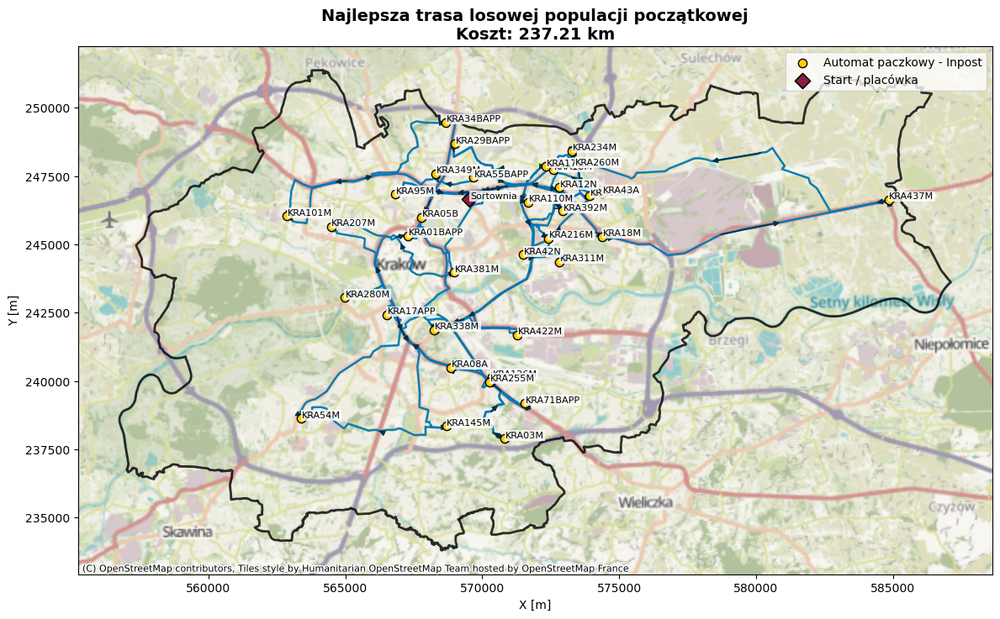

In [27]:
initial_best_route = initial_pop[0]
initial_best_cost = initial_fit[0]

plot_route_static(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    route=initial_best_route,
    G=G_proj,
    path_cache=path_cache,
    title="Najlepsza trasa losowej populacji początkowej",
    subtitle=f"Koszt: {initial_best_cost/1000:.2f} km",
    use_basemap=True
)

#### 11. Wyznaczenie prawdopodobieństwa selekcji oraz ruletkowy wybór rodziców

In [28]:
def build_rank_probabilities(population, fitness, a=0.10, b=0.90):
    """
    funkcja wyznacza prawdopodibienstwa wyboru 
    poszczegolnych tras na podstawie ich jakosci 
    """
    n = len(population)
    population, fitness = sort_population(population, fitness)
    ranks = np.arange(n, 0, -1, dtype=float) # najlepszy osobnik dostanie najwyzsza range
    r_opt = ranks[0] # najlepszy
    raw_probs = a + b * (ranks / r_opt) # wyznaczenie prawdopodobienstw
    probs = raw_probs / raw_probs.sum() # normalizacja

    return population, fitness, probs


def roulette_group_selection(population, fitness, a=0.10, b=0.90):
    """
    funkcja wybiera osobnika metoda ruletki
    """
    population, fitness, probs = build_rank_probabilities(population, fitness, a=a, b=b)
    idx = np.random.choice(len(population), p=probs)
    
    return population[idx].copy()

#### 12. Operatory Genetyczne

In [29]:
def ordered_crossover(parent1, parent2, start_idx=0):
    """
    Operator krzyżowania uporządkowanego
    """
    p1 = parent1[1:] # usuniecie punktu startu niepodlegajacego mutacji
    p2 = parent2[1:]

    left, right = sorted(random.sample(range(len(p1)), 2)) # losowe cięcie

    child = [None] * len(p1) # pusty potomek
    child[left:right + 1] = p1[left:right + 1] # kopia z rodzica nr 1

    reszta = []
    for gene in p2:
        if gene not in child:
            reszta.append(gene) # pozostałe punkty od rodzica nr 2

    rem_idx = 0
    for i in range(len(child)):
        if child[i] is None:
            child[i] = reszta[rem_idx] # uzupelnienie brakow
            rem_idx += 1

    return [start_idx] + child # dodanie punktu startu

In [30]:
def get_dynamic_mutation_rate(base_rate, generation, max_generations):
    """
    Operator dynamicznej zmiany prawdopodobienstwa mutacji
    """
    stage = generation / max_generations # etap ewolucji

    if stage < 0.3:
        return base_rate * 1.15 # wieksza mutacja
    if stage < 0.7:
        return base_rate # zmniejszenie udzialu
    return base_rate * 0.85 # mala mutacja i lepsze dopasowanie

In [31]:
def mutate_swap(route, start_idx=0):
    """ 
    Operator mutacji poprzez podmienienie
    """
    child = route.copy() # utworzenie dziecka
    i, j = sorted(random.sample(range(1, len(child)), 2)) # losowanie genow do mutacji
    child[i], child[j] = child[j], child[i] # zamiana punktow miejscami
    return child

In [32]:
def mutate_insertion(route, start_idx=0):
    """ 
    Operator mutacji poprzez wstawienie
    """
    child = route.copy() # utworzenie dziecka 
    i, j = sorted(random.sample(range(1, len(child)), 2)) # losowanie genow do mutacji
    gene = child.pop(j) # usuniecie wybranego punktu
    child.insert(i, gene) # wstawienie usunietego punktu w nowym miejscu
    return child

In [33]:
def mutate_inversion(route, start_idx=0):
    """ 
    Operator mutacji poprzez odwrocenie
    """
    child = route.copy() # utworzenie dziecka
    i, j = sorted(random.sample(range(1, len(child)), 2)) # losowanie zakresu genów do mutacji
    child[i:j+1] = child[i:j+1][::-1] # odwrócenie fragmentu trasy
    return child

In [34]:
def mutate(route, mutation_mode="swap", start_idx=0):
    """
    funkcja obslugujaca parametryzacje mutacji 
    """
    if mutation_mode == "swap":
        return mutate_swap(route, start_idx=start_idx)
    if mutation_mode == "insertion":
        return mutate_insertion(route, start_idx=start_idx)
    if mutation_mode == "inversion":
        return mutate_inversion(route, start_idx=start_idx)
    raise ValueError("Nieznany tryb mutacji.")

#### 13. Tworzenie populacji potomnej.

In [35]:
def create_next_generation(population, fitness, cost_matrix, config):
    """ 
    Funkcja tworzenia kolejnego pokolenia algorytmu genetycznego
    """
    population, fitness = sort_population(population, fitness)

    new_population = []

    best = config["elite_size"]
    for i in range(best):
        new_population.append(population[i].copy()) # kopia najlepszych genow do nowej populacji

    while len(new_population) < config["population_size"]:
        parent1 = roulette_group_selection(population, fitness, a=config["selection_a"], b=config["selection_b"]) # wybor rodzica nr 1
        parent2 = roulette_group_selection(population, fitness, a=config["selection_a"], b=config["selection_b"]) # wybor rodzica nr 2

        if random.random() < config["crossover_rate"]:
            child1 = ordered_crossover(parent1, parent2, start_idx=config["start_idx"]) # potomek 1 po krzyzowaniu
            child2 = ordered_crossover(parent2, parent1, start_idx=config["start_idx"]) # potomek 2 po krzyzowaniu
        else:
            child1 = parent1.copy()
            child2 = parent2.copy()

        if random.random() < config["mutation_rate"]:
            child1 = mutate(child1, mutation_mode=config["mutation_mode"], start_idx=config["start_idx"]) # mutacja potomka 1

        if len(new_population) < config["population_size"]:
            new_population.append(child1) # dodanie potomka do nowej populacji

        if len(new_population) < config["population_size"]:
            if random.random() < config["mutation_rate"]:
                child2 = mutate(child2, mutation_mode=config["mutation_mode"], start_idx=config["start_idx"]) # mutacja potomka 2
            new_population.append(child2) # dodanie potomka do nowej populacji

    return new_population

#### 14. Algorytm Genetyczny

In [36]:
def genetic_algorithm(cost_matrix, config):
    """
    Główna funkcja algorytmu genetycznego rozwiązującego problem komiwojażera.

    - generuje populację początkową losowych tras,
    - ocenia jakość każdego osobnika na podstawie macierzy kosztów,
    - iteracyjnie tworzy kolejne pokolenia z użyciem selekcji, krzyżowania i mutacji,
    - zapisuje historię najlepszych, średnich i najgorszych wyników,
    - zatrzymuje działanie po osiągnięciu limitu stagnacji lub maksymalnej liczby generacji.
    funkcja przyujmuje jako parametry: 
    Macierz kosztów cost_matrix przejazdu pomiędzy punktami, gdzie element [i, j]
    oznacza koszt przejścia z punktu i do punktu j.

    config: Słownik parametrów sterujących działaniem algorytmu genetycznego,
    m.in. liczebnością populacji, prawdopodobieństwem krzyżowania,
    mutacji, wielkością elity i warunkiem stopu.
    """
    random.seed(config["random_seed"])
    np.random.seed(config["random_seed"])

    n_points = cost_matrix.shape[0]

    population = create_population(
        population_size=config["population_size"],
        n_points=n_points,
        start_idx=config["start_idx"]
    )

    fitness = evaluate_population(population, cost_matrix)
    population, fitness = sort_population(population, fitness)

    best_route = population[0].copy()
    best_cost = fitness[0]

    hist_best = [best_cost]
    hist_mean = [fitness.mean()]
    hist_worst = [fitness[-1]]
    hist_routes = [best_route.copy()]

    stagnation_counter = 0
    generation = 0

    while stagnation_counter < config["stagnation_limit"] and generation < config["max_generations"]:
        generation += 1

        next_population = create_next_generation(population, fitness, cost_matrix, config)
        next_fitness = evaluate_population(next_population, cost_matrix)
        next_population, next_fitness = sort_population(next_population, next_fitness)

        curr_best_rt = next_population[0].copy()
        curr_best_cost = next_fitness[0]

        hist_best.append(curr_best_cost)
        hist_mean.append(next_fitness.mean())
        hist_worst.append(next_fitness[-1])
        hist_routes.append(curr_best_rt.copy())

        if curr_best_cost < best_cost:
            best_cost = curr_best_cost
            best_route = curr_best_rt.copy()
            stagnation_counter = 0
        else:
            stagnation_counter += 1

        population = next_population
        fitness = next_fitness

    result = {
        "best_route": best_route,
        "best_cost": best_cost,
        "hist_best": hist_best,
        "hist_mean": hist_mean,
        "hist_worst": hist_worst,
        "hist_routes": hist_routes,
        "generations_done": generation,
        "stagnation_counter": stagnation_counter
    }

    return result

#### 14.1. Wywołanie i wynik algorytmu genetycznnego

In [37]:
ga_result = genetic_algorithm(cost_matrix, GA_CONFIG)

print("Zakończono po generacjach:", ga_result["generations_done"])
print("Najlepszy koszt [m]:", ga_result["best_cost"])
print("Ostatni licznik stagnacji:", ga_result["stagnation_counter"])

Zakończono po generacjach: 501
Najlepszy koszt [m]: 114015.59997359084
Ostatni licznik stagnacji: 60


#### 15. Wizualizacja historii kosztu

In [38]:
def plot_optimization_hist(hist_best, hist_mean=None, hist_worst=None,
                              title="Historia optymalizacji"):
    plt.figure(figsize=(12, 5))

    hist_best_km = np.array(hist_best) / 1000
    plt.plot(hist_best_km, label="Najlepszy koszt")

    if hist_mean is not None:
        hist_mean_km = np.array(hist_mean) / 1000
        plt.plot(hist_mean_km, label="Średni koszt")

    if hist_worst is not None:
        hist_worst_km = np.array(hist_worst) / 1000
        plt.plot(hist_worst_km, label="Najgorszy koszt")

    plt.xlabel("Generacja")
    plt.ylabel("Koszt [km]")
    plt.title(title)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

#### 16. Wizualizacja przebiegu kosztu i  najlepszej trasy

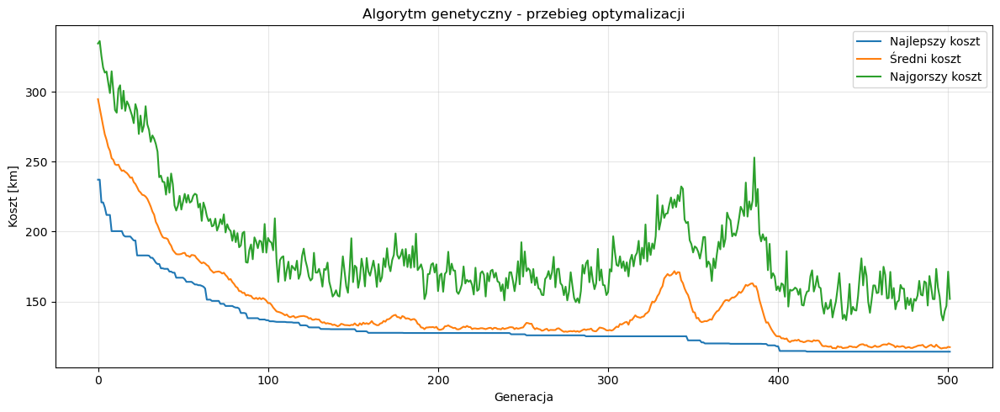

In [39]:
plot_optimization_hist(
    ga_result["hist_best"],
    ga_result["hist_mean"],
    ga_result["hist_worst"],
    title="Algorytm genetyczny - przebieg optymalizacji"
)


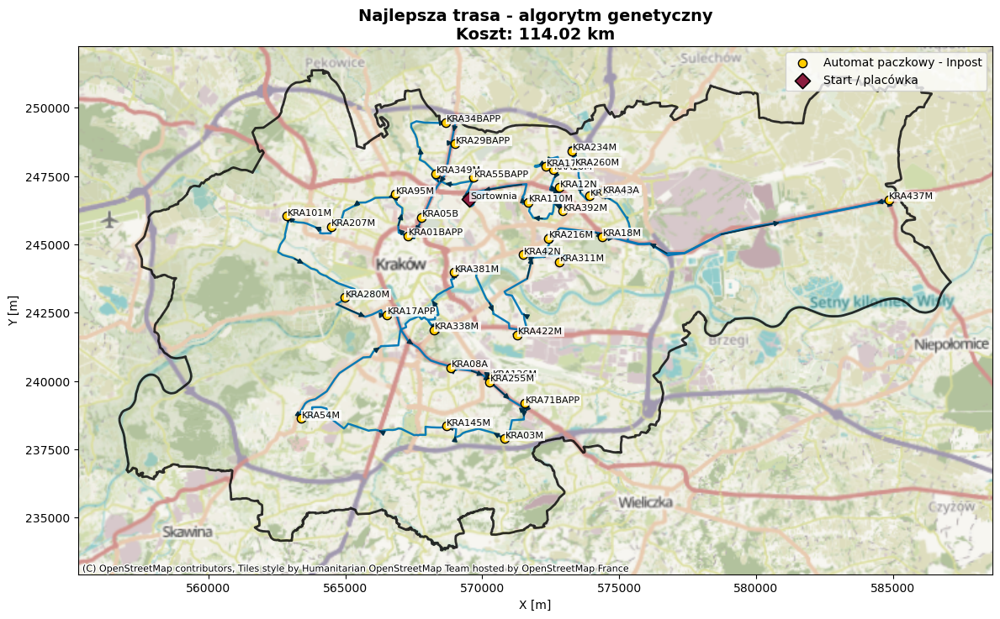

In [40]:
plot_route_static(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    route=ga_result["best_route"],
    G=G_proj,
    path_cache=path_cache,
    title="Najlepsza trasa - algorytm genetyczny",
    subtitle=f"Koszt: {ga_result['best_cost']/1000:.2f} km",
    use_basemap=True
)

#### 17. Mapa interaktywna z trasą - Folium

In [41]:
def prepare_folium_data(region_gdf, all_points_gdf, G_proj):
    region_wgs84 = region_gdf.to_crs(epsg=4326).copy()
    points_wgs84 = all_points_gdf.to_crs(epsg=4326).copy()

    points_wgs84["lon"] = points_wgs84.geometry.x
    points_wgs84["lat"] = points_wgs84.geometry.y

    nearest_node_geoms = []
    nearest_node_ids = []

    for node_id in all_points_gdf["nearest_node"]:
        node_data = G_proj.nodes[node_id]
        nearest_node_geoms.append(Point(node_data["x"], node_data["y"]))
        nearest_node_ids.append(node_id)

    nearest_nodes_gdf = gpd.GeoDataFrame({"nearest_node": nearest_node_ids}, geometry=nearest_node_geoms, crs="EPSG:2180").to_crs(epsg=4326)

    nearest_nodes_gdf["lon"] = nearest_nodes_gdf.geometry.x
    nearest_nodes_gdf["lat"] = nearest_nodes_gdf.geometry.y

    snap_lines = []
    snap_distances = []

    for i in range(len(all_points_gdf)):
        point_geom = all_points_gdf.iloc[i].geometry
        node_geom = nearest_node_geoms[i]
        snap_lines.append(LineString([point_geom, node_geom]))
        snap_distances.append(point_geom.distance(node_geom))

    snap_lines_gdf = gpd.GeoDataFrame(
        {
            "name": all_points_gdf["name"].values,
            "nearest_node": nearest_node_ids,
            "snap_distance_m": snap_distances
        },
        geometry=snap_lines,
        crs="EPSG:2180"
    ).to_crs(epsg=4326)

    return region_wgs84, points_wgs84, nearest_nodes_gdf, snap_lines_gdf


def plot_folium_points(region_gdf_wgs84, points_gdf_wgs84, nearest_nodes_gdf_wgs84=None, snap_lines_gdf_wgs84=None, show_snap=True):
    center_lat = points_gdf_wgs84["lat"].mean()
    center_lon = points_gdf_wgs84["lon"].mean()

    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=12,
        control_scale=True,
        tiles="cartodbpositron"
    )

    folium.GeoJson(
        region_gdf_wgs84.to_json(),
        name="Obszar",
        style_function=lambda feature: {
            "fillColor": "#00000000",
            "color": "black",
            "weight": 2
        }
    ).add_to(m)

    if show_snap and snap_lines_gdf_wgs84 is not None:
        folium.GeoJson(
            snap_lines_gdf_wgs84.to_json(),
            name="Paczkomat → nearest node",
            style_function=lambda feature: {
                "color": "#E53935",
                "weight": 2,
                "opacity": 0.85,
                "dashArray": "6, 6"
            },
            tooltip=folium.GeoJsonTooltip(
                fields=["name", "nearest_node", "snap_distance_m"],
                aliases=["Punkt", "Nearest node", "Odległość snap [m]"],
                localize=True
            )
        ).add_to(m)

    for _, row in points_gdf_wgs84.iterrows():
        location = [row["lat"], row["lon"]]

        if row["id"] == 0:
            icon = folium.Icon(color="red", icon="home", prefix="fa")
            popup = f"""
            <b>Start / sortownia</b><br>
            Nazwa: {row['name']}<br>
            Nearest node: {row.get('nearest_node', 'brak')}
            """
        else:
            icon = folium.Icon(color="orange", icon="box-open", prefix="fa")
            popup = f"""
            <b>Paczkomat</b><br>
            Nazwa: {row['name']}<br>
            Nearest node: {row.get('nearest_node', 'brak')}
            """

        folium.Marker(
            location=location,
            icon=icon,
            tooltip=row["name"],
            popup=folium.Popup(popup, max_width=300)
        ).add_to(m)

    if show_snap and nearest_nodes_gdf_wgs84 is not None:
        nearest_layer = folium.FeatureGroup(name="Nearest nodes", show=True)

        for i, row in nearest_nodes_gdf_wgs84.iterrows():
            point_name = points_gdf_wgs84.iloc[i]["name"]
            snap_distance = None
            if snap_lines_gdf_wgs84 is not None:
                snap_distance = snap_lines_gdf_wgs84.iloc[i]["snap_distance_m"]

            popup_text = f"""
            <b>Nearest node</b><br>
            Dla punktu: {point_name}<br>
            Node ID: {row['nearest_node']}
            """
            if snap_distance is not None:
                popup_text += f"<br>Snap distance: {snap_distance:.2f} m"

            folium.CircleMarker(
                location=[row["lat"], row["lon"]],
                radius=4,
                color="#1565C0",
                fill=True,
                fill_color="#1565C0",
                fill_opacity=0.95,
                weight=2,
                tooltip=f"Nearest node dla: {point_name}",
                popup=folium.Popup(popup_text, max_width=300)
            ).add_to(nearest_layer)

        nearest_layer.add_to(m)

    folium.LayerControl(collapsed=False).add_to(m)
    return m


def add_route_to_folium_map(base_map, route, G, path_cache,
                            color="#0077B6", weight=4, opacity=0.9,
                            arrow_color="#023047", arrows=True):
    closed_route = route + [route[0]]

    for i in range(len(closed_route) - 1):
        a = closed_route[i]
        b = closed_route[i + 1]
        node_path = path_cache.get((a, b), None)

        if node_path is None or len(node_path) < 2:
            continue

        latlon_coords = []
        for node in node_path:
            x = G.nodes[node]["x"]
            y = G.nodes[node]["y"]

            temp = gpd.GeoDataFrame(geometry=[Point(x, y)], crs="EPSG:2180").to_crs(epsg=4326)
            lon = temp.geometry.iloc[0].x
            lat = temp.geometry.iloc[0].y
            latlon_coords.append((lat, lon))

        polyline = folium.PolyLine(
            locations=latlon_coords,
            color=color,
            weight=weight,
            opacity=opacity
        ).add_to(base_map)

        if arrows:
            PolyLineTextPath(
                polyline,
                text="    ➜    ",
                repeat=True,
                offset=7,
                attributes={
                    "fill": arrow_color,
                    "font-weight": "bold",
                    "font-size": "10"
                }
            ).add_to(base_map)

    return base_map

#### 17.1. Mapa interaktywna najlepszej trasy - algorytm genetyczny.

In [42]:
region_folium_gdf, points_folium_gdf, nearest_nodes_folium_gdf, snap_lines_folium_gdf = prepare_folium_data(
    region_gdf,
    all_points_gdf,
    G_proj
)

m_ga = plot_folium_points(
    region_folium_gdf,
    points_folium_gdf,
    nearest_nodes_gdf_wgs84=nearest_nodes_folium_gdf,
    snap_lines_gdf_wgs84=snap_lines_folium_gdf,
    show_snap=True
)

m_ga = add_route_to_folium_map(
    base_map=m_ga,
    route=ga_result["best_route"],
    G=G_proj,
    path_cache=path_cache,
    color="#0077B6",
    weight=4,
    opacity=0.9,
    arrow_color="#023047",
    arrows=True
)

m_ga.save(f"best_GA_map_{city_name}_{OPERATOR}.html")
m_ga

#### 18. Generacja GIF

In [43]:
def create_gif(region_gdf, all_points_gdf, G, path_cache,
               hist_routes, hist_best,
               gif_name="ga_evolution.gif",
               frame_step=10,
               fps=4,
               use_basemap=True):

    images = []
    indices = list(range(0, len(hist_routes), frame_step))
    if (len(hist_routes) - 1) not in indices:
        indices.append(len(hist_routes) - 1)

    for idx in indices:
        route = hist_routes[idx]
        cost = hist_best[idx]

        fig, ax = plt.subplots(figsize=PLOT_FIGSIZE)
        region_gdf.boundary.plot(ax=ax, linewidth=2, edgecolor="black", alpha=0.8, zorder=1)

        closed_route = route + [route[0]]

        for i in range(len(closed_route) - 1):
            node_path = path_cache.get((closed_route[i], closed_route[i + 1]))

            if node_path and len(node_path) >= 2:
                xs = [G.nodes[n]["x"] for n in node_path]
                ys = [G.nodes[n]["y"] for n in node_path]

                ax.plot(xs, ys, linewidth=1.8, color="#0077B6", alpha=0.95, zorder=2)

                if len(xs) >= 2:
                    if len(xs) == 2:
                        x1, y1 = xs[0], ys[0]
                        x2, y2 = xs[1], ys[1]
                    else:
                        pos = len(xs) // 2
                        pos = min(pos, len(xs) - 2)
                        x1, y1 = xs[pos], ys[pos]
                        x2, y2 = xs[pos + 1], ys[pos + 1]

                    ax.annotate(
                        "",
                        xy=(x2, y2),
                        xytext=(x1, y1),
                        arrowprops=dict(
                            arrowstyle="-|>",
                            color="#023047",
                            lw=1.2,
                            mutation_scale=9
                        ),
                        zorder=4
                    )

        brand_colors = {
            "inpost": "#FFCC00",
            "allegro": "#2E7D32",
            "dpd": "#1565C0",
            "orlen": "#C62828",
            "dhl": "#F9A825"
        }

        is_depot = (
            (all_points_gdf["id"] == 0) |
            (all_points_gdf["name"].isin(["Sortownia", "Placówka", "Facility", "START"]))
        )

        depot = all_points_gdf[is_depot].copy()
        others = all_points_gdf[~all_points_gdf.index.isin(depot.index)].copy()

        if not others.empty:
            for brand_key, color in brand_colors.items():
                subset = others[
                    others["brand"].fillna("").str.lower().str.contains(brand_key)
                ].copy()

                if not subset.empty:
                    ax.scatter(
                        subset["x"], subset["y"],
                        s=55,
                        marker="o",
                        facecolor=color,
                        edgecolor="black",
                        linewidth=1.0,
                        zorder=5,
                        label=f"Automat paczkowy - {brand_key.capitalize()}"
                    )

            other_points = others[
                ~others["brand"].fillna("").str.lower().str.contains("|".join(brand_colors.keys()))
            ].copy()

            if not other_points.empty:
                ax.scatter(
                    other_points["x"], other_points["y"],
                    s=55,
                    marker="o",
                    facecolor="#BDBDBD",
                    edgecolor="black",
                    linewidth=1.0,
                    zorder=5,
                    label="Automat paczkowy - inny operator"
                )

        if not depot.empty:
            ax.scatter(
                depot["x"], depot["y"],
                s=85,
                marker="D",
                facecolor="#8B1E3F",
                edgecolor="black",
                linewidth=1.2,
                zorder=6,
                label="Start / placówka"
            )

        if use_basemap:
            try:
                ctx.add_basemap(ax, crs=all_points_gdf.crs)
            except Exception:
                pass

        ax.set_title(
            f"Ewolucja trasy - algorytm genetyczny\nEpoka: {idx} | Koszt: {cost / 1000:.2f} km",
            fontsize=14,
            fontweight="bold"
        )
        ax.legend()
        plt.tight_layout()

        buf = io.BytesIO()
        fig.savefig(buf, format="png", dpi=120)
        buf.seek(0)
        images.append(imageio.imread(buf))

        plt.close(fig)

    imageio.mimsave(gif_name, images, fps=fps)
    print(f"GIF zapisany jako: {gif_name}")
    return gif_name

In [44]:
gif_name = create_gif(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    G=G_proj,
    path_cache=path_cache,
    hist_routes=ga_result["hist_routes"],
    hist_best=ga_result["hist_best"],
    gif_name=f"ga_{city_name}.gif",
    frame_step=10,
    fps=1
)

GIF zapisany jako: ga_Kraków.gif


## CZĘŚĆ III - Algorytm Mrówkowy

#### 19. Parametry Algorytmu Mrówkowego

In [45]:
ACO_CONFIG = {
    "n_ants": N_ANTS,  # liczba mrówek tworzących rozwiązania w jednym cyklu
    "n_cycles": N_CYCLES,  # maksymalna liczba cykli algorytmu
    "alpha": ALPHA,  # wpływ feromonu na wybór kolejnego punktu
    "beta": BETA,  # wpływ odległości na wybór kolejnego punktu
    "evaporation": EVAPORATION,  # współczynnik parowania feromonu
    "q": Q,  # stała określająca ilość odkładanego feromonu
    "start_fixed": START_FIXED,  # czy trasa ma zawsze zaczynać się od punktu startowego
    "start_idx": 0,  # indeks punktu startowego
    "convergence_stop": CONVERGENCE_STOP,  # zatrzymanie po osiągnięciu zbieżności
    "random_seed": SEED  # ustawienie ziarna losowego
}

USE_ROAD_NETWORK = False
SAVE_GIF = True

In [46]:
random.seed(ACO_CONFIG["random_seed"])
np.random.seed(ACO_CONFIG["random_seed"])

#### 20. Funkcje pomocnicze Algorytmu Mrówkowego

In [47]:
def create_heuristic_matrix(cost_matrix):
    """
    Funkcja oblicza macierz heurystyki na podstawie macierzy kosztów
    """
    n = cost_matrix.shape[0]
    heuristic = np.zeros((n, n), dtype=float)

    for i in range(n):
        for j in range(n):
            if i != j and np.isfinite(cost_matrix[i, j]) and cost_matrix[i, j] > 0:
                heuristic[i, j] = 1.0 / cost_matrix[i, j]
            else:
                # wartosc 0 dla tego samego punktu lub blednego kosztu
                heuristic[i, j] = 0.0

    return heuristic

In [48]:
def initialize_pheromone_matrix(n_points, initial_value=1.0):
    """
    funkcja tworzy poczatkowa macierz feromonów dla wszystkich przejsc
    """
    pheromone = np.full((n_points, n_points), initial_value, dtype=float)
    np.fill_diagonal(pheromone, 0.0)
    return pheromone

In [49]:
def normalize_probabilities(values):
    """ 
    funkcja normalizuje wartości (suma 1)
    """
    total = np.sum(values)
    if total <= 0:
        return None
    return values / total

In [50]:
def choose_next_point(current_city, unvisited, pheromone, heuristic, alpha, beta):
    """ 
    funkcja wybiera kolejny punkt trasy na podstawie feromonu i heurystyki
    """
    unvisited = list(unvisited)

    desirability = []
    for city in unvisited:
        # atrakcyjnosc przejscia obliczona na podstaiwe ilosci feromonu i heurystyki
        tau = pheromone[current_city, city]
        eta = heuristic[current_city, city]
        value = (tau ** alpha) * (eta ** beta)
        desirability.append(value)

    desirability = np.array(desirability, dtype=float)
    probs = normalize_probabilities(desirability)

    if probs is None:
        return random.choice(unvisited)

    chosen_idx = np.random.choice(len(unvisited), p=probs)
    return unvisited[chosen_idx]

In [51]:
def build_ant_route(cost_matrix, pheromone, heuristic, config):
    """ 
    funkcja buduje trasę mrówek przez wszystkie punkty
    """
    n_points = cost_matrix.shape[0]

    # definicja statrtu 
    if config["start_fixed"]:
        start_city = config["start_idx"]
    else:
        start_city = random.randint(0, n_points - 1)

    route = [start_city]
    unvisited = set(range(n_points))
    unvisited.remove(start_city)

    current_city = start_city
    # mrowka odwiedza kolejne punkty aż do wykorzystania wszystkich
    while len(unvisited) > 0:
        next_city = choose_next_point(
            current_city=current_city,
            unvisited=unvisited,
            pheromone=pheromone,
            heuristic=heuristic,
            alpha=config["alpha"],
            beta=config["beta"]
        )
        route.append(next_city)
        unvisited.remove(next_city)
        current_city = next_city

    return route

In [52]:
def build_all_ant_routes(cost_matrix, pheromone, heuristic, config):
    """ 
    funkcja buduje trasy dla wszystkich mrowek i oblicza ich koszty
    """
    routes = []
    costs = []

    for _ in range(config["n_ants"]):
        route = build_ant_route(cost_matrix, pheromone, heuristic, config) # trasa mrowki
        cost = route_cost(route, cost_matrix) # koszt przejscia
        routes.append(route)
        costs.append(cost)

    return routes, np.array(costs, dtype=float)

In [53]:
def evaporate_pheromone(pheromone, evaporation):
    """" 
    funkcja parowania, zmniejsza poziom feromonu zgodnie z parametrami
    """
    pheromone = pheromone * (1.0 - evaporation)
    return pheromone

In [54]:
def deposit_pheromone(pheromone, routes, costs, q):
    """
    funkcja dodaje fermomn na trasach przez ktore przebyły mrowki
    """
    for route, cost in zip(routes, costs):
        deposit_value = q / cost # ilość feromonu zależna od kosztu trasy
        closed_route = route + [route[0]]
        
        # dodanie feromonu na kazdym odcinku zamknietej trasy
        for i in range(len(closed_route) - 1):
            a = closed_route[i]
            b = closed_route[i + 1]
            pheromone[a, b] += deposit_value # dodanie feromonu dla przejscia a -> b
            pheromone[b, a] += deposit_value # dodanie feromonu dla przejscia b -> a ( dwustronne dzialanie )

    return pheromone

In [55]:
def all_routes_equal(routes):
    """
    funkcja sprawdza czy wszystkie mrowki wyznaczyly taka sama trase
    """
    if len(routes) == 0:
        return False

    first_route = routes[0] # pierwsza jako wzor
    for route in routes[1:]:
        if route != first_route:
            return False # sprawdzanie jezeli chociaz jedna jest rozna to false

    return True

In [56]:
def plot_all_connections(ax, all_points_gdf, G, path_cache, color="#1565C0", linewidth=0.9, alpha=0.35, zorder=2):
    """ 
    funkcja wizualizacji wszystkich tras
    """
    point_ids = all_points_gdf["id"].tolist()
    n = len(point_ids)

    for i in range(n):
        for j in range(i + 1, n):
            a = point_ids[i]
            b = point_ids[j]

            node_path = path_cache.get((a, b), None) # ścieżka między punktami a -> b
            if node_path is None:
                node_path = path_cache.get((b, a), None) # sprawdzenie ścieżki odwrotnej

            if node_path is not None and len(node_path) >= 2:
                xs = [G.nodes[node]["x"] for node in node_path]
                ys = [G.nodes[node]["y"] for node in node_path]

                ax.plot(xs, ys, color=color, linewidth=linewidth, alpha=alpha, zorder=zorder)

In [57]:
def plot_pheromone_connections(ax, pheromone, all_points_gdf, G, path_cache,
                               base_color="#0077B6",
                               base_linewidth=1.8,
                               min_alpha=0.0,
                               max_alpha=0.95,
                               percentile_clip=98,
                               power=2.0,
                               zorder=2):
    """ 
    funkcja rysuje połączenia między punktami z intensywnością zależną od ilości feromonu
    """
    point_ids = all_points_gdf["id"].tolist()
    n = len(point_ids)

    vals = []
    for i in range(n):
        for j in range(i + 1, n):
            vals.append(pheromone[i, j])

    vals = np.array(vals, dtype=float)
    positive_vals = vals[vals > 0]

    if len(positive_vals) == 0:
        return

    p_min = positive_vals.min()
    p_max = np.percentile(positive_vals, percentile_clip)

    if p_max <= p_min:
        p_max = positive_vals.max()

    for i in range(n):
        for j in range(i + 1, n):
            a = point_ids[i]
            b = point_ids[j]

            node_path = path_cache.get((a, b), None)
            if node_path is None:
                node_path = path_cache.get((b, a), None)

            if node_path is None or len(node_path) < 2:
                continue

            value = pheromone[i, j]
            if value <= 0:
                continue

            max_allowed = min(value, p_max) # ograniczenie zbyt dużych wartości feromonu

            if p_max > p_min:
                norm = (max_allowed - p_min) / (p_max - p_min)
            else:
                norm = 0.0

            norm = max(0.0, min(1.0, norm))
            norm = norm ** power

            alpha = min_alpha + norm * (max_alpha - min_alpha) # przezroczystość drogi

            if alpha <= 0:
                continue

            xs = [G.nodes[node]["x"] for node in node_path]
            ys = [G.nodes[node]["y"] for node in node_path]

            ax.plot(
                xs,
                ys,
                color=base_color,
                linewidth=base_linewidth,
                alpha=alpha,
                zorder=zorder
            )

In [58]:
def plot_aco_state(region_gdf, all_points_gdf, G, path_cache,
                   route=None, pheromone=None,
                   title="Stan ACO", subtitle=None,
                   use_basemap=True, figsize=PLOT_FIGSIZE,
                   show_all_connections=False,
                   show_pheromone=False,
                   label_points=True,
                   return_fig=False):
    """ 
    zmodyfikowana funkcja ktora rysuje aktualny stan aco na mapie
    """
    fig, ax = plt.subplots(figsize=figsize)

    region_gdf.boundary.plot(ax=ax, linewidth=2, edgecolor="black", alpha=0.8, zorder=3)

    if use_basemap:
        try:
            ctx.add_basemap(ax, crs=all_points_gdf.crs)
        except Exception:
            pass

    if show_all_connections:
        plot_all_connections(
            ax=ax,
            all_points_gdf=all_points_gdf,
            G=G,
            path_cache=path_cache,
            color="#4F81BD",
            linewidth=0.8,
            alpha=0.28,
            zorder=1.5
        )

    if show_pheromone and pheromone is not None:
        plot_pheromone_connections(
            ax=ax,
            pheromone=pheromone,
            all_points_gdf=all_points_gdf,
            G=G,
            path_cache=path_cache,
            base_color="#0077B6",
            base_linewidth=1.8,
            min_alpha=0.005,
            max_alpha=0.95,
            percentile_clip=98,
            power=1.3,
            zorder=2.2
        )

    if route is not None and len(route) > 0:
        closed_route = route + [route[0]]

        for i in range(len(closed_route) - 1):
            a = closed_route[i]
            b = closed_route[i + 1]

            node_path = path_cache.get((a, b), None)
            if node_path is None:
                node_path = path_cache.get((b, a), None)

            if node_path is not None and len(node_path) >= 2:
                xs = [G.nodes[node]["x"] for node in node_path]
                ys = [G.nodes[node]["y"] for node in node_path]

                ax.plot(xs, ys, linewidth=2.6, color="#0077B6", alpha=0.95, zorder=4)

                if len(xs) >= 4:
                    arrow_positions = np.linspace(1, len(xs) - 2, num=min(3, len(xs) - 2), dtype=int)
                else:
                    arrow_positions = [len(xs) // 2]

                for pos in arrow_positions:
                    left_idx = max(0, pos - 1)
                    right_idx = min(len(xs) - 1, pos + 1)

                    x1, y1 = xs[left_idx], ys[left_idx]
                    x2, y2 = xs[right_idx], ys[right_idx]

                    ax.annotate(
                        "",
                        xy=(x2, y2),
                        xytext=(x1, y1),
                        arrowprops=dict(
                            arrowstyle="-|>",
                            color="#023047",
                            lw=1.2,
                            mutation_scale=9,
                            shrinkA=0,
                            shrinkB=0
                        ),
                        zorder=5
                    )

    is_depot = (
        (all_points_gdf["id"] == 0) |
        (all_points_gdf["name"].isin(["Sortownia", "Placówka", "Facility", "START"]))
    )

    depot = all_points_gdf[is_depot].copy()
    others = all_points_gdf[~all_points_gdf.index.isin(depot.index)].copy()

    brand_colors = {
        "inpost": "#FFCC00",
        "allegro": "#2E7D32",
        "dpd": "#1565C0",
        "orlen": "#C62828",
        "dhl": "#F9A825"
    }

    if not others.empty:
        for brand_key, color in brand_colors.items():
            subset = others[
                others["brand"].fillna("").str.lower().str.contains(brand_key)
            ].copy()

            if not subset.empty:
                ax.scatter(
                    subset["x"], subset["y"],
                    s=55,
                    marker="o",
                    facecolor=color,
                    edgecolor="black",
                    linewidth=1.0,
                    zorder=6,
                    label=f"Automat paczkowy - {brand_key.capitalize()}"
                )

        other_points = others[
            ~others["brand"].fillna("").str.lower().str.contains("|".join(brand_colors.keys()))
        ].copy()

        if not other_points.empty:
            ax.scatter(
                other_points["x"], other_points["y"],
                s=55,
                marker="o",
                facecolor="#BDBDBD",
                edgecolor="black",
                linewidth=1.0,
                zorder=6,
                label="Automat paczkowy - inny operator"
            )

    if not depot.empty:
        ax.scatter(
            depot["x"], depot["y"],
            s=85,
            marker="D",
            facecolor="#8B1E3F",
            edgecolor="black",
            linewidth=1.2,
            zorder=7,
            label="Start / placówka"
        )

    if label_points:
        for _, row in all_points_gdf.iterrows():
            ax.text(
                row["x"] + 25,
                row["y"] + 25,
                f"{row['name']}",
                fontsize=8,
                bbox=dict(facecolor="white", edgecolor="none", alpha=0.75, pad=1.0),
                zorder=8
            )

    minx, miny, maxx, maxy = region_gdf.total_bounds
    pad_x = (maxx - minx) * 0.08
    pad_y = (maxy - miny) * 0.08

    ax.set_xlim(minx - pad_x, maxx + pad_x)
    ax.set_ylim(miny - pad_y, maxy + pad_y)
    ax.set_aspect("equal")

    full_title = title if subtitle is None else f"{title}\n{subtitle}"
    ax.set_title(full_title, fontsize=14, fontweight="bold")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.legend()
    plt.tight_layout()

    if return_fig:
        return fig, ax

    plt.show()

#### 21. Algorytm Mrówkowy

In [59]:
def ant_colony_optimization(cost_matrix, config):
    """
    Wykonuje algorytm mrówkowy ACO w celu znalezienia możliwie najkrótszej trasy.

    Funkcja tworzy macierz heurystyki i macierz feromonów, a następnie w kolejnych
    cyklach buduje trasy dla wszystkich mrówek. Po każdej iteracji aktualizowany
    jest najlepszy znaleziony wynik, zapisywana jest historia działania algorytmu,
    feromon częściowo odparowuje, a następnie jest dodawany na trasach mrówek.

    Parametry:
        cost_matrix (np.ndarray): macierz kosztów przejścia między punktami
        config (dict): słownik z ustawieniami algorytmu ACO

    Zwraca:
        dict: słownik zawierający najlepszą trasę, jej koszt, historię wyników,
              historię tras, historię feromonu, końcową macierz feromonu,
              liczbę wykonanych cykli oraz informację o zbieżności algorytmu
    """
    random.seed(config["random_seed"])
    np.random.seed(config["random_seed"])

    n_points = cost_matrix.shape[0]

    heuristic = create_heuristic_matrix(cost_matrix)
    pheromone = initialize_pheromone_matrix(n_points, initial_value=1.0)
    best_route = None
    best_cost = np.inf

    hist_best = []
    hist_mean = []
    hist_worst = []
    hist_routes = []
    hist_global_best_routes = []
    hist_global_best_costs = []

    hist_pheromone = [pheromone.copy()]

    cycles_done = 0
    converged = False

    for cycle in range(config["n_cycles"]):
        routes, costs = build_all_ant_routes(cost_matrix, pheromone, heuristic, config)

        best_idx = np.argmin(costs)
        curr_best_rt = routes[best_idx].copy()
        curr_best_cost = costs[best_idx]

        if curr_best_cost < best_cost:
            best_cost = curr_best_cost
            best_route = curr_best_rt.copy()

        hist_best.append(curr_best_cost)
        hist_mean.append(costs.mean())
        hist_worst.append(costs.max())

        hist_routes.append(curr_best_rt.copy())
        hist_global_best_routes.append(best_route.copy())
        hist_global_best_costs.append(best_cost)

        pheromone = evaporate_pheromone(pheromone, config["evaporation"])
        pheromone = deposit_pheromone(pheromone, routes, costs, config["q"])

        hist_pheromone.append(pheromone.copy())

        cycles_done = cycle + 1

        if config["convergence_stop"] and all_routes_equal(routes):
            converged = True
            break

    result = {
        "best_route": best_route,
        "best_cost": best_cost,
        "hist_best": hist_best,
        "hist_mean": hist_mean,
        "hist_worst": hist_worst,
        "hist_routes": hist_routes,
        "hist_global_best_routes": hist_global_best_routes,
        "hist_global_best_costs": hist_global_best_costs,
        "hist_pheromone": hist_pheromone,
        "final_pheromone": pheromone.copy(),
        "cycles_done": cycles_done,
        "converged": converged
    }

    return result

#### 21.1. Wyniki algorytmu mrówkowego

In [60]:
aco_result = ant_colony_optimization(cost_matrix, ACO_CONFIG)

print("Liczba wykonanych cykli:", aco_result["cycles_done"])
print("Czy osiągnięto zbieżność:", aco_result["converged"])
print("Najlepszy koszt ACO [m]:", aco_result["best_cost"])
print("Najlepsza trasa ACO:", aco_result["best_route"])

Liczba wykonanych cykli: 200
Czy osiągnięto zbieżność: False
Najlepszy koszt ACO [m]: 115985.83637694413
Najlepsza trasa ACO: [11, 23, 12, 22, 24, 10, 29, 34, 14, 6, 19, 0, 4, 35, 3, 30, 33, 27, 17, 13, 1, 9, 21, 28, 25, 7, 18, 15, 2, 26, 8, 16, 5, 20, 32, 31]


#### 22. Wizualizacje

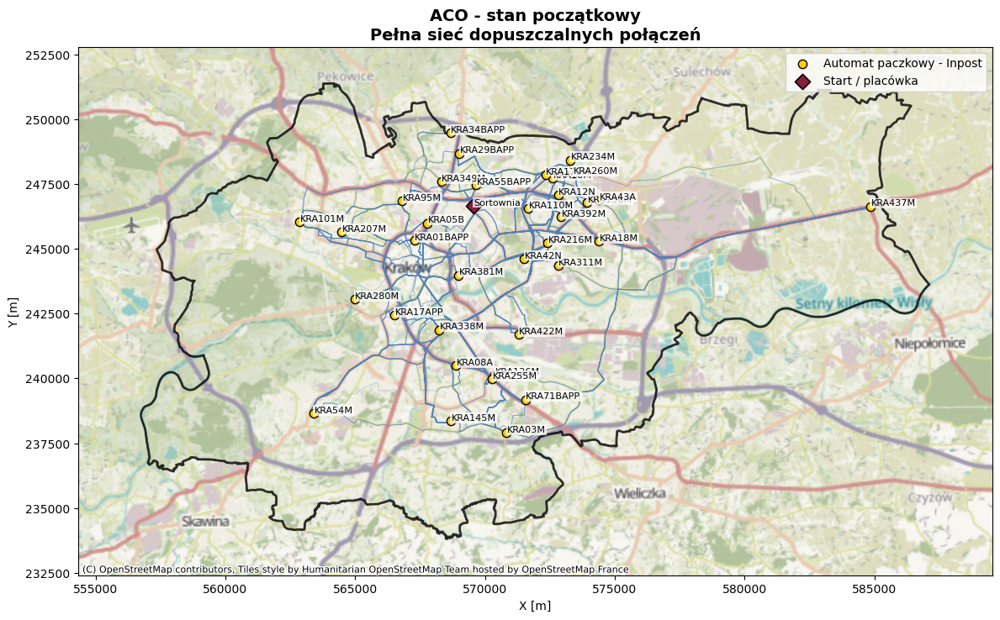

In [61]:
plot_aco_state(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    G=G_proj,
    path_cache=path_cache,
    route=None,
    pheromone=None,
    title="ACO - stan początkowy",
    subtitle="Pełna sieć dopuszczalnych połączeń",
    use_basemap=True,
    show_all_connections=True,
    show_pheromone=False
)

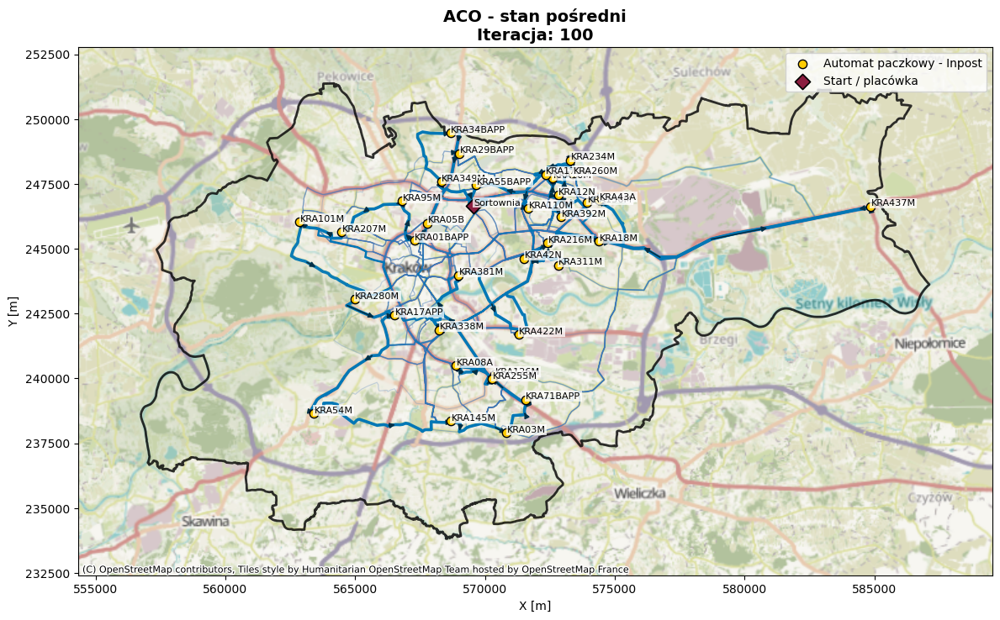

In [62]:
mid_idx = len(aco_result["hist_routes"]) // 2
iter_idx = 200
plot_aco_state(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    G=G_proj,
    path_cache=path_cache,
    route=aco_result["hist_global_best_routes"][mid_idx - 1],
    pheromone=aco_result["hist_pheromone"][mid_idx],
    title="ACO - stan pośredni",
    subtitle=f"Iteracja: {mid_idx}",
    use_basemap=True,
    show_all_connections=True,
    show_pheromone=True
)

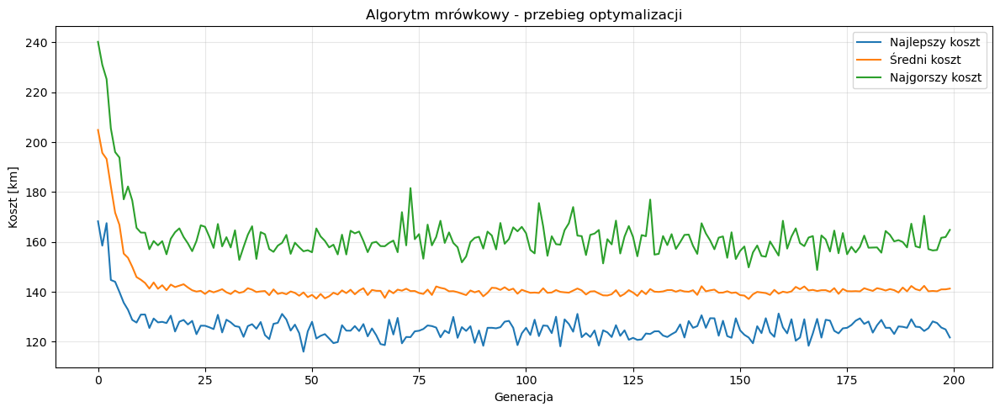

In [63]:
plot_optimization_hist(
    aco_result["hist_best"],
    aco_result["hist_mean"],
    aco_result["hist_worst"],
    title="Algorytm mrówkowy - przebieg optymalizacji"
)

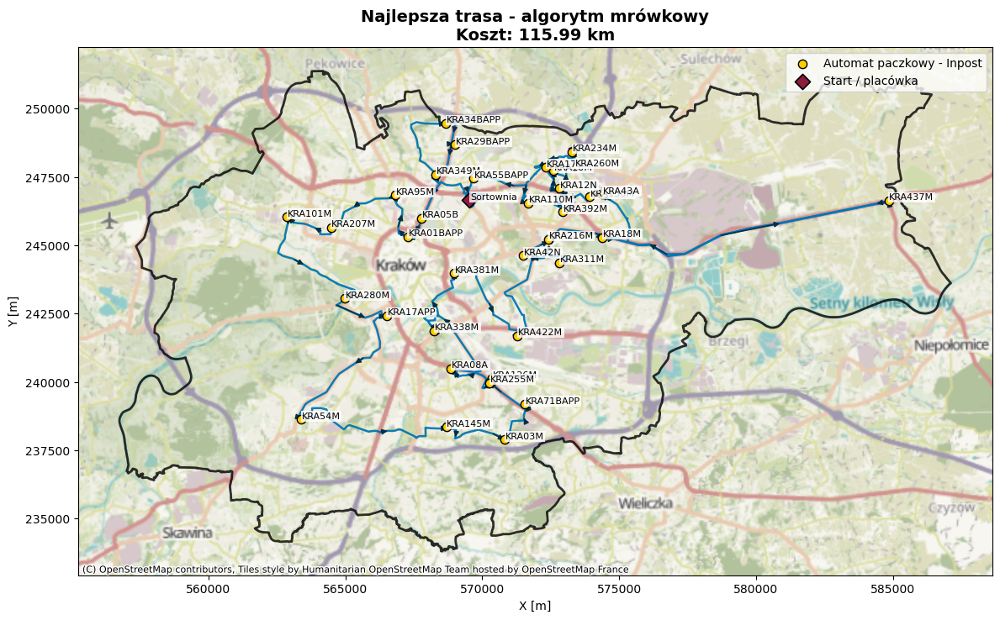

In [64]:
plot_route_static(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    route=aco_result["best_route"],
    G=G_proj,
    path_cache=path_cache,
    title="Najlepsza trasa - algorytm mrówkowy",
    subtitle=f"Koszt: {aco_result['best_cost']/1000:.2f} km",
    use_basemap=True
)

In [65]:
region_folium_gdf, points_folium_gdf, nearest_nodes_folium_gdf, snap_lines_folium_gdf = prepare_folium_data(
    region_gdf,
    all_points_gdf,
    G_proj
)

m_aco = plot_folium_points(
    region_folium_gdf,
    points_folium_gdf,
    nearest_nodes_gdf_wgs84=nearest_nodes_folium_gdf,
    snap_lines_gdf_wgs84=snap_lines_folium_gdf,
    show_snap=True
)

m_aco = add_route_to_folium_map(
    base_map=m_aco,
    route=aco_result["best_route"],
    G=G_proj,
    path_cache=path_cache,
    color="#0077B6",
    weight=4,
    opacity=0.9,
    arrow_color="#023047",
    arrows=True
)

m_aco.save(f"best_ACO_map_{city_name}_{OPERATOR}.html")
m_aco

#### 22. Gif mrówkowy

In [66]:
def create_aco_gif(region_gdf, all_points_gdf, G, path_cache, aco_result,
                   gif_name="aco_krakow.gif",
                   frame_step=5,
                   fps=2,
                   use_basemap=True,
                   final_hold_ratio=0.10):
    images = []

    hist_pheromone = aco_result["hist_pheromone"]
    hist_global_best_routes = aco_result["hist_global_best_routes"]

    indices = list(range(0, len(hist_global_best_routes), frame_step))
    if len(hist_global_best_routes) > 0 and (len(hist_global_best_routes) - 1) not in indices:
        indices.append(len(hist_global_best_routes) - 1)

    total_main_frames = 1 + len(indices) + 1
    final_hold_frames = max(1, int(np.ceil(total_main_frames * final_hold_ratio)))

    def fig_to_image(fig):
        buf = io.BytesIO()
        fig.savefig(buf, format="png", dpi=120)
        buf.seek(0)
        img = imageio.imread(buf)
        plt.close(fig)
        return img

    fig, ax = plot_aco_state(
        region_gdf=region_gdf,
        all_points_gdf=all_points_gdf,
        G=G,
        path_cache=path_cache,
        route=None,
        pheromone=None,
        title="ACO - stan początkowy",
        subtitle="Pełna sieć dopuszczalnych połączeń przed uruchomieniem algorytmu",
        use_basemap=use_basemap,
        show_all_connections=True,
        show_pheromone=False,
        return_fig=True
    )
    images.append(fig_to_image(fig))

    for idx in indices:
        fig, ax = plot_aco_state(
            region_gdf=region_gdf,
            all_points_gdf=all_points_gdf,
            G=G,
            path_cache=path_cache,
            route=hist_global_best_routes[idx],
            pheromone=hist_pheromone[idx + 1],
            title="ACO - stan pośredni",
            subtitle=f"Cykl: {idx + 1}",
            use_basemap=use_basemap,
            show_all_connections=False,
            show_pheromone=True,
            return_fig=True
        )
        images.append(fig_to_image(fig))

    fig, ax = plot_route_static(
        region_gdf=region_gdf,
        all_points_gdf=all_points_gdf,
        route=aco_result["best_route"],
        G=G,
        path_cache=path_cache,
        title="Najlepsza trasa - algorytm mrówkowy",
        subtitle=f"Koszt: {aco_result['best_cost']/1000:.2f} km",
        use_basemap=use_basemap,
        return_fig=True
    )
    final_img = fig_to_image(fig)
    images.append(final_img)

    for _ in range(final_hold_frames):
        images.append(final_img)

    imageio.mimsave(gif_name, images, fps=fps)
    print(f"GIF zapisany jako: {gif_name}")
    return gif_name

In [67]:
aco_gif_name = create_aco_gif(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    G=G_proj,
    path_cache=path_cache,
    aco_result=aco_result,
    gif_name=f"aco_{city_name}.gif",
    frame_step=2,
    fps=2,
    use_basemap=True,
    final_hold_ratio=0.10
)

GIF zapisany jako: aco_Kraków.gif


## CZĘŚĆ IV - Porównanie Algorytmów

In [68]:
comp_df = pd.DataFrame({
    "Wariant": ["Losowa startowa", "Algorytm genetyczny", "Algorytm mrówkowy"],
    "Koszt [m]": [
        initial_best_cost,
        ga_result["best_cost"],
        aco_result["best_cost"]
    ]
})

comp_df["Koszt [km]"] = comp_df["Koszt [m]"] / 1000
comp_df["Poprawa względem losowej [m]"] = comp_df["Koszt [m]"].iloc[0] - comp_df["Koszt [m]"]
comp_df["Poprawa względem losowej [%]"] = (
    100 * (comp_df["Koszt [m]"].iloc[0] - comp_df["Koszt [m]"]) / comp_df["Koszt [m]"].iloc[0]
)

comp_df

,Wariant,Koszt [m],Koszt [km],Poprawa względem losowej [m],Poprawa względem losowej [%]
0,Losowa startowa,237209.386999,237.209387,0.000000,0.000000
1,Algorytm genetyczny,114015.599974,114.015600,123193.787025,51.934617
2,Algorytm mrówkowy,115985.836377,115.985836,121223.550622,51.104028


In [69]:
random_cost = initial_best_cost
ga_cost = ga_result["best_cost"]
aco_cost = aco_result["best_cost"]

print(f"Poprawa GA względem trasy losowej: {random_cost - ga_cost:.2f} m ({100*(random_cost-ga_cost)/random_cost:.2f}%)")
print(f"Poprawa ACO względem trasy losowej: {random_cost - aco_cost:.2f} m ({100*(random_cost-aco_cost)/random_cost:.2f}%)")
print(f"Różnica ACO vs GA: {ga_cost - aco_cost:.2f} m")

Poprawa GA względem trasy losowej: 123193.79 m (51.93%)
Poprawa ACO względem trasy losowej: 121223.55 m (51.10%)
Różnica ACO vs GA: -1970.24 m


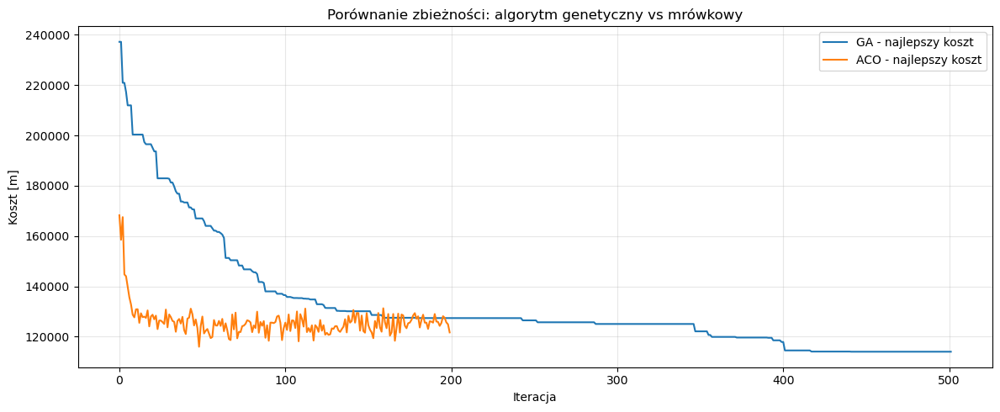

In [70]:
plt.figure(figsize=(12, 5))

plt.plot(ga_result["hist_best"], label="GA - najlepszy koszt")
plt.plot(aco_result["hist_best"], label="ACO - najlepszy koszt")

plt.xlabel("Iteracja")
plt.ylabel("Koszt [m]")
plt.title("Porównanie zbieżności: algorytm genetyczny vs mrówkowy")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [71]:
def plot_compare_routes_static(region_gdf, all_points_gdf,
                               route_ga, route_aco,
                               G, path_cache,
                               ga_label="Algorytm genetyczny",
                               aco_label="Algorytm mrówkowy",
                               ga_cost=None, aco_cost=None,
                               title="Porównanie tras GA vs ACO",
                               use_basemap=True,
                               figsize=PLOT_FIGSIZE):
    fig, ax = plt.subplots(figsize=figsize)

    region_gdf.boundary.plot(ax=ax, linewidth=2, edgecolor="black", alpha=0.8, zorder=1)

    ga_route_color = "#00FF55"
    ga_arrow_color = "#028002"

    aco_route_color = "#F200FF"
    aco_arrow_color = "#560854"

    point_color = "#FFCC00"
    start_color = "#8B1E3F"

    def draw_route(route, route_color, arrow_color, z_line, z_arrow):
        closed_route = route + [route[0]]

        for i in range(len(closed_route) - 1):
            a = closed_route[i]
            b = closed_route[i + 1]
            node_path = path_cache.get((a, b), None)

            if node_path is not None and len(node_path) >= 2:
                xs = [G.nodes[node]["x"] for node in node_path]
                ys = [G.nodes[node]["y"] for node in node_path]

                ax.plot(xs, ys, linewidth=1.8, color=route_color, alpha=0.82, zorder=z_line)

                if len(xs) >= 4:
                    arrow_positions = np.linspace(1, len(xs) - 2, num=min(3, len(xs) - 2), dtype=int)
                else:
                    arrow_positions = [len(xs) // 2]

                for pos in arrow_positions:
                    left_idx = max(0, pos - 1)
                    right_idx = min(len(xs) - 1, pos + 1)

                    x1, y1 = xs[left_idx], ys[left_idx]
                    x2, y2 = xs[right_idx], ys[right_idx]

                    ax.annotate(
                        "",
                        xy=(x2, y2),
                        xytext=(x1, y1),
                        arrowprops=dict(
                            arrowstyle="-|>",
                            color=arrow_color,
                            lw=1.1,
                            mutation_scale=8,
                            shrinkA=0,
                            shrinkB=0,
                            alpha=0.9
                        ),
                        zorder=z_arrow
                    )

    draw_route(route_ga, ga_route_color, ga_arrow_color, z_line=2, z_arrow=3)
    draw_route(route_aco, aco_route_color, aco_arrow_color, z_line=4, z_arrow=5)

    depot = all_points_gdf[all_points_gdf["id"] == 0].copy()
    others = all_points_gdf[all_points_gdf["id"] != 0].copy()

    if not others.empty:
        ax.scatter(
            others["x"], others["y"],
            s=55,
            marker="o",
            facecolor=point_color,
            edgecolor="black",
            linewidth=1.0,
            zorder=6,
            label="Paczkomaty"
        )

    if not depot.empty:
        ax.scatter(
            depot["x"], depot["y"],
            s=85,
            marker="D",
            facecolor=start_color,
            edgecolor="black",
            linewidth=1.2,
            zorder=7,
            label="Start / sortownia"
        )

    for _, row in all_points_gdf.iterrows():
        ax.text(
            row["x"] + 25,
            row["y"] + 25,
            f"{row['name']}",
            fontsize=8,
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.8, pad=1.0),
            zorder=8
        )

    if use_basemap:
        try:
            ctx.add_basemap(ax, crs=all_points_gdf.crs)
        except Exception:
            pass

    legend_handles = [
        plt.Line2D([0], [0], color=ga_route_color, lw=2, label=ga_label),
        plt.Line2D([0], [0], color=aco_route_color, lw=2, label=aco_label),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=point_color,
                   markeredgecolor='black', markersize=7, label="Paczkomaty"),
        plt.Line2D([0], [0], marker='D', color='w', markerfacecolor=start_color,
                   markeredgecolor='black', markersize=7, label="Start / sortownia")
    ]

    subtitle_parts = []
    if ga_cost is not None:
        subtitle_parts.append(f"GA: {ga_cost/1000:.2f} km")
    if aco_cost is not None:
        subtitle_parts.append(f"ACO: {aco_cost/1000:.2f} km")

    full_title = title
    if subtitle_parts:
        full_title += "\n" + " | ".join(subtitle_parts)

    ax.set_title(full_title, fontsize=14, fontweight="bold")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.legend(handles=legend_handles, loc="best")
    plt.tight_layout()
    plt.show()

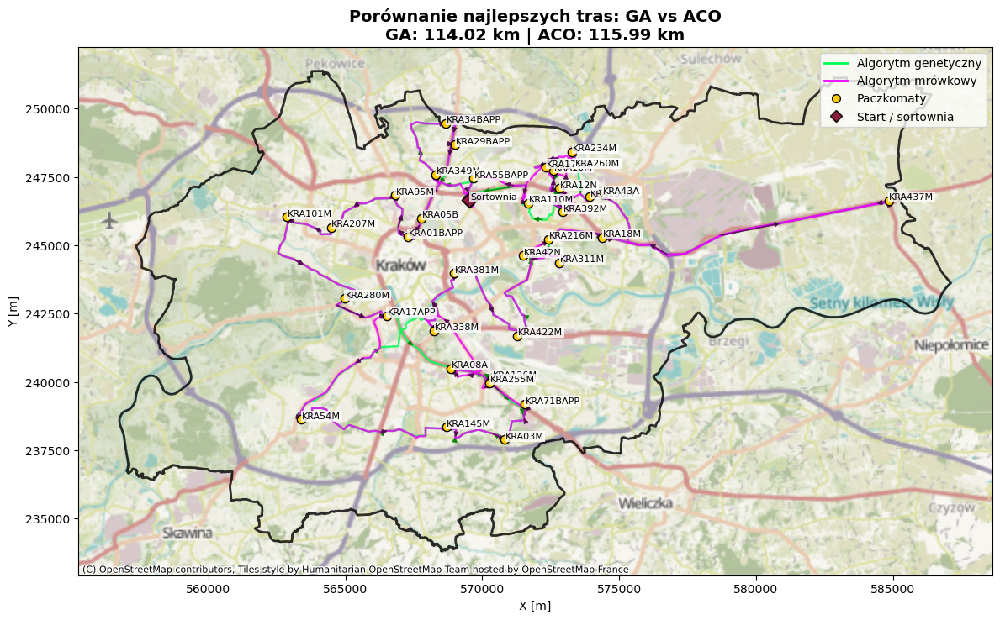

In [72]:
plot_compare_routes_static(
    region_gdf=region_gdf,
    all_points_gdf=all_points_gdf,
    route_ga=ga_result["best_route"],
    route_aco=aco_result["best_route"],
    G=G_proj,
    path_cache=path_cache,
    ga_label="Algorytm genetyczny",
    aco_label="Algorytm mrówkowy",
    ga_cost=ga_result["best_cost"],
    aco_cost=aco_result["best_cost"],
    title="Porównanie najlepszych tras: GA vs ACO",
    use_basemap=True,
    figsize=PLOT_FIGSIZE
)

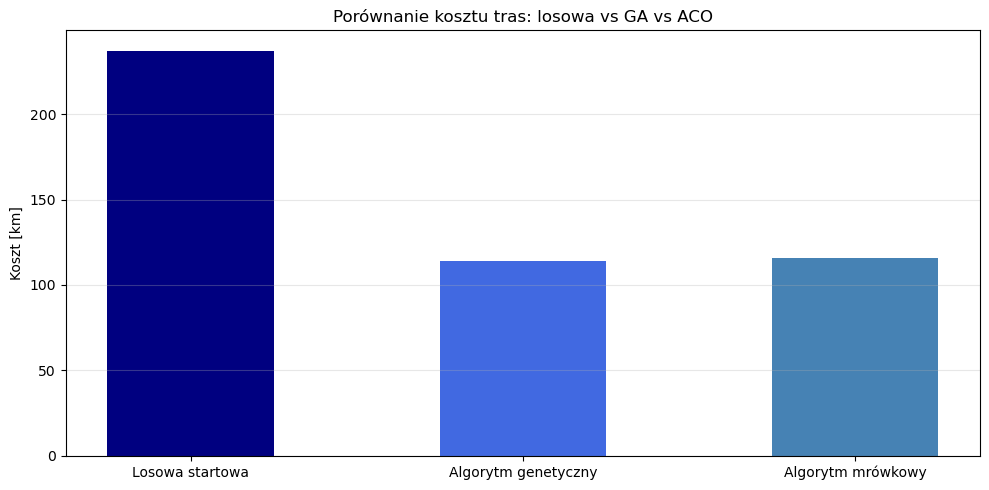

In [73]:
plt.figure(figsize=(10, 5))
plt.bar(
    comp_df["Wariant"],
    comp_df["Koszt [km]"],
    color=["navy", "royalblue", "steelblue"],
    width=0.5
)
plt.ylabel("Koszt [km]")
plt.title("Porównanie kosztu tras: losowa vs GA vs ACO")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

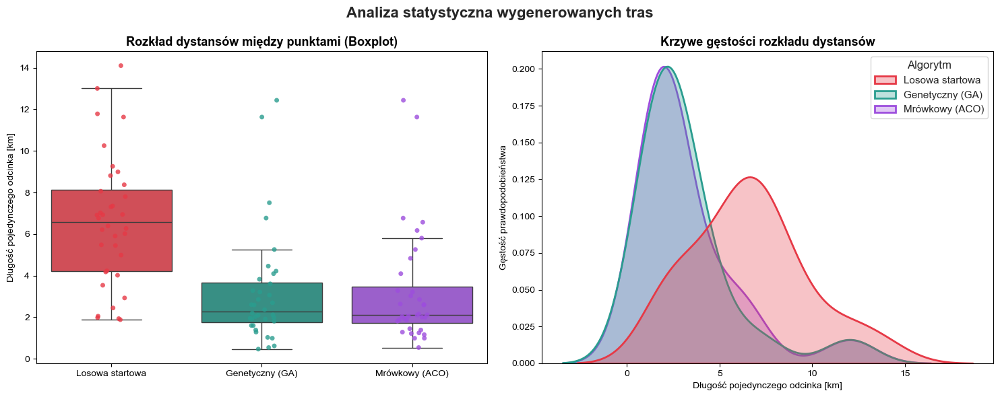

In [74]:
def get_edge_distances(route, cost_matrix):
    distances = []
    closed_route = route + [route[0]]
    for i in range(len(closed_route) - 1):
        a = closed_route[i]
        b = closed_route[i + 1]
        dist_km = cost_matrix[a, b] / 1000.0
        distances.append(dist_km)
    return distances

random_route = initial_best_route
best_ga_route = ga_result["best_route"]
best_aco_route = aco_result["best_route"]

dist_random = get_edge_distances(random_route, cost_matrix)
dist_ga = get_edge_distances(best_ga_route, cost_matrix)
dist_aco = get_edge_distances(best_aco_route, cost_matrix)

data = []
for d in dist_random:
    data.append({"Algorytm": "Losowa startowa", "Dystans odcinka [km]": d})
for d in dist_ga:
    data.append({"Algorytm": "Genetyczny (GA)", "Dystans odcinka [km]": d})
for d in dist_aco:
    data.append({"Algorytm": "Mrówkowy (ACO)", "Dystans odcinka [km]": d})

df = pd.DataFrame(data)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.set_theme(style="whitegrid")
paleta = {
    "Losowa startowa": "#E63946",
    "Genetyczny (GA)": "#2A9D8F",
    "Mrówkowy (ACO)": "#9D4EDD"
}

sns.boxplot(
    data=df,
    x="Algorytm",
    y="Dystans odcinka [km]",
    hue="Algorytm",
    palette=paleta,
    ax=axes[0],
    showfliers=False,
    legend=False
)

sns.stripplot(
    data=df,
    x="Algorytm",
    y="Dystans odcinka [km]",
    hue="Algorytm",
    palette=paleta,
    ax=axes[0],
    size=5,
    jitter=True,
    alpha=0.8,
    legend=False
)

axes[0].set_title("Rozkład dystansów między punktami (Boxplot)", fontsize=13, fontweight="bold")
axes[0].set_ylabel("Długość pojedynczego odcinka [km]")
axes[0].set_xlabel("")

sns.kdeplot(
    data=df,
    x="Dystans odcinka [km]",
    hue="Algorytm",
    palette=paleta,
    fill=True,
    common_norm=False,
    alpha=0.3,
    ax=axes[1],
    linewidth=2
)

axes[1].set_title("Krzywe gęstości rozkładu dystansów", fontsize=13, fontweight="bold")
axes[1].set_ylabel("Gęstość prawdopodobieństwa")
axes[1].set_xlabel("Długość pojedynczego odcinka [km]")

plt.suptitle("Analiza statystyczna wygenerowanych tras", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("rozklad_dystansow.png", dpi=300)
plt.show()

### Źródła, inspiracje i uwagi metodyczne

Pomysł realizacji zadania w przedstawionej formie ma charakter autorski. Początkowo rozpocząłem pracę nad problemem zgodnie z zaproponowanym przykładem optymalizacji trasy dla zbioru miast. W trakcie realizacji projektu zdecydowałem się jednak na zmianę podejścia i wykorzystanie lokalizacji automatów paczkowych jako punktów odwiedzin. Uznałem, że taki model będzie bardziej realistyczny oraz ciekawszy z punktu widzenia zastosowań praktycznych w logistyce, a przy okazji pozwoli na wykorzystanie znanych mi bibliotek.

Pozyskiwanie danych przestrzennych oraz ich wizualizacja były dla mnie możliwe dzięki wiedzy zdobytej podczas przedmiotu ASnaliza Danych Przestrzennych. Natomiast wyznaczenie węzłów sieci drogowej oraz rzeczywistych tras przejazdu pomiędzy punktami wymagało ode mnie szczegółowego zapoznania się z dokumentacją dostawców wykorzystywanych bibliotek oraz zrozumienia sposobu reprezentacji sieci drogowej w danych OpenStreetMap.

W szczególności korzystałem z dokumentacji:

- **OSMnx**  
  https://osmnx.readthedocs.io/

- **NetworkX**  
  https://networkx.org/documentation/stable/

- **OpenStreetMap**  
  https://www.openstreetmap.org/

Teoria dotycząca zastosowanych metod optymalizacji, została opracowana przeze mnie w oparciu o źródła przedstawione w sprawozdaniu PDF.